# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = [False, False],
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    encode_covariates=False,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=['status_control', 'time_cat'],
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v3_1_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/tmp/ipykernel_2037513/1884487943.py:51: UserWarning: `(None, ['status_control', 'time_cat'])` is defined as `batch_key` or `categorical_covariate`, it will be given to both encoder and decoder. Make sure this does not contain information of any of your disentenglement targets. For example, if `donor_id` is chosen as a batch key, do not disentengle donor level information such as `sex` or `age`. The decoder should not use the disentengled latent spaces, simply ignores, if it is already given a batch_key. 
  tardis.MyModel.setup_anndata(adata, **dataset_params)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: iiwc0ciy
Name: ancient-force-154
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/iiwc0ciy
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_160313-iiwc0ciy/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4475,10768
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1109,2701
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:10<1:40:29, 10.07s/it]

Epoch 1/600:   0%|          | 1/600 [00:10<1:40:29, 10.07s/it, v_num=iy_1, total_loss_train=3.69e+3, kl_local_train=47]

Epoch 2/600:   0%|          | 1/600 [00:10<1:40:29, 10.07s/it, v_num=iy_1, total_loss_train=3.69e+3, kl_local_train=47]

Epoch 2/600:   0%|          | 2/600 [00:19<1:34:32,  9.48s/it, v_num=iy_1, total_loss_train=3.69e+3, kl_local_train=47]

Epoch 2/600:   0%|          | 2/600 [00:19<1:34:32,  9.48s/it, v_num=iy_1, total_loss_train=3.23e+3, kl_local_train=71.3]

Epoch 3/600:   0%|          | 2/600 [00:19<1:34:32,  9.48s/it, v_num=iy_1, total_loss_train=3.23e+3, kl_local_train=71.3]

Epoch 3/600:   0%|          | 3/600 [00:27<1:29:11,  8.96s/it, v_num=iy_1, total_loss_train=3.23e+3, kl_local_train=71.3]

Epoch 3/600:   0%|          | 3/600 [00:27<1:29:11,  8.96s/it, v_num=iy_1, total_loss_train=3.21e+3, kl_local_train=73.3]

Epoch 4/600:   0%|          | 3/600 [00:27<1:29:11,  8.96s/it, v_num=iy_1, total_loss_train=3.21e+3, kl_local_train=73.3]

Epoch 4/600:   1%|          | 4/600 [00:35<1:25:38,  8.62s/it, v_num=iy_1, total_loss_train=3.21e+3, kl_local_train=73.3]

Epoch 4/600:   1%|          | 4/600 [00:35<1:25:38,  8.62s/it, v_num=iy_1, total_loss_train=3.21e+3, kl_local_train=69.8]

Epoch 5/600:   1%|          | 4/600 [00:35<1:25:38,  8.62s/it, v_num=iy_1, total_loss_train=3.21e+3, kl_local_train=69.8]

Epoch 5/600:   1%|          | 5/600 [00:44<1:26:44,  8.75s/it, v_num=iy_1, total_loss_train=3.21e+3, kl_local_train=69.8]

Epoch 5/600:   1%|          | 5/600 [00:44<1:26:44,  8.75s/it, v_num=iy_1, total_loss_train=3.21e+3, kl_local_train=61.2]

Epoch 6/600:   1%|          | 5/600 [00:45<1:26:44,  8.75s/it, v_num=iy_1, total_loss_train=3.21e+3, kl_local_train=61.2]

Epoch 6/600:   1%|          | 6/600 [00:53<1:28:21,  8.93s/it, v_num=iy_1, total_loss_train=3.21e+3, kl_local_train=61.2]

Epoch 6/600:   1%|          | 6/600 [00:53<1:28:21,  8.93s/it, v_num=iy_1, total_loss_train=3.2e+3, kl_local_train=43.7, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 7/600:   1%|          | 6/600 [00:53<1:28:21,  8.93s/it, v_num=iy_1, total_loss_train=3.2e+3, kl_local_train=43.7, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 7/600:   1%|          | 7/600 [01:02<1:26:09,  8.72s/it, v_num=iy_1, total_loss_train=3.2e+3, kl_local_train=43.7, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 7/600:   1%|          | 7/600 [01:02<1:26:09,  8.72s/it, v_num=iy_1, total_loss_train=3.19e+3, kl_local_train=39.1, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 8/600:   1%|          | 7/600 [01:02<1:26:09,  8.72s/it, v_num=iy_1, total_loss_train=3.19e+3, kl_local_train=39.1, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 8/600:   1%|▏         | 8/600 [01:09<1:22:17,  8.34s/it, v_num=iy_1, total_loss_train=3.19e+3, kl_local_train=39.1, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 8/600:   1%|▏         | 8/600 [01:09<1:22:17,  8.34s/it, v_num=iy_1, total_loss_train=3.17e+3, kl_local_train=47, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]  

Epoch 9/600:   1%|▏         | 8/600 [01:09<1:22:17,  8.34s/it, v_num=iy_1, total_loss_train=3.17e+3, kl_local_train=47, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 9/600:   2%|▏         | 9/600 [01:17<1:21:54,  8.32s/it, v_num=iy_1, total_loss_train=3.17e+3, kl_local_train=47, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 9/600:   2%|▏         | 9/600 [01:17<1:21:54,  8.32s/it, v_num=iy_1, total_loss_train=3.15e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 10/600:   2%|▏         | 9/600 [01:17<1:21:54,  8.32s/it, v_num=iy_1, total_loss_train=3.15e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 10/600:   2%|▏         | 10/600 [01:26<1:21:57,  8.34s/it, v_num=iy_1, total_loss_train=3.15e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 10/600:   2%|▏         | 10/600 [01:26<1:21:57,  8.34s/it, v_num=iy_1, total_loss_train=3.15e+3, kl_local_train=118, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351] 

Epoch 11/600:   2%|▏         | 10/600 [01:27<1:21:57,  8.34s/it, v_num=iy_1, total_loss_train=3.15e+3, kl_local_train=118, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 11/600:   2%|▏         | 11/600 [01:35<1:23:29,  8.51s/it, v_num=iy_1, total_loss_train=3.15e+3, kl_local_train=118, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00787, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0351]

Epoch 11/600:   2%|▏         | 11/600 [01:35<1:23:29,  8.51s/it, v_num=iy_1, total_loss_train=3.14e+3, kl_local_train=163, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]   

Epoch 12/600:   2%|▏         | 11/600 [01:35<1:23:29,  8.51s/it, v_num=iy_1, total_loss_train=3.14e+3, kl_local_train=163, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 12/600:   2%|▏         | 12/600 [01:42<1:21:04,  8.27s/it, v_num=iy_1, total_loss_train=3.14e+3, kl_local_train=163, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 12/600:   2%|▏         | 12/600 [01:42<1:21:04,  8.27s/it, v_num=iy_1, total_loss_train=3.14e+3, kl_local_train=210, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 13/600:   2%|▏         | 12/600 [01:42<1:21:04,  8.27s/it, v_num=iy_1, total_loss_train=3.14e+3, kl_local_train=210, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 13/600:   2%|▏         | 13/600 [01:51<1:20:32,  8.23s/it, v_num=iy_1, total_loss_train=3.14e+3, kl_local_train=210, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 13/600:   2%|▏         | 13/600 [01:51<1:20:32,  8.23s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=250, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 14/600:   2%|▏         | 13/600 [01:51<1:20:32,  8.23s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=250, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 14/600:   2%|▏         | 14/600 [01:58<1:19:20,  8.12s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=250, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 14/600:   2%|▏         | 14/600 [01:58<1:19:20,  8.12s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=307, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 15/600:   2%|▏         | 14/600 [01:58<1:19:20,  8.12s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=307, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 15/600:   2%|▎         | 15/600 [02:07<1:20:03,  8.21s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=307, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 15/600:   2%|▎         | 15/600 [02:07<1:20:03,  8.21s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=342, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 16/600:   2%|▎         | 15/600 [02:08<1:20:03,  8.21s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=342, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 16/600:   3%|▎         | 16/600 [02:15<1:20:42,  8.29s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=342, metric_mi|status_control_train=0.0477, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.061, metric_mi|mouse_train=0.0951]

Epoch 16/600:   3%|▎         | 16/600 [02:15<1:20:42,  8.29s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=363, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106] 

Epoch 17/600:   3%|▎         | 16/600 [02:15<1:20:42,  8.29s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=363, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 17/600:   3%|▎         | 17/600 [02:24<1:20:28,  8.28s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=363, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 17/600:   3%|▎         | 17/600 [02:24<1:20:28,  8.28s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=399, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 18/600:   3%|▎         | 17/600 [02:24<1:20:28,  8.28s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=399, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 18/600:   3%|▎         | 18/600 [02:32<1:20:01,  8.25s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=399, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 18/600:   3%|▎         | 18/600 [02:32<1:20:01,  8.25s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=404, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 19/600:   3%|▎         | 18/600 [02:32<1:20:01,  8.25s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=404, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 19/600:   3%|▎         | 19/600 [02:40<1:18:29,  8.11s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=404, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 19/600:   3%|▎         | 19/600 [02:40<1:18:29,  8.11s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=412, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 20/600:   3%|▎         | 19/600 [02:40<1:18:29,  8.11s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=412, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 20/600:   3%|▎         | 20/600 [02:48<1:18:16,  8.10s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=412, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 20/600:   3%|▎         | 20/600 [02:48<1:18:16,  8.10s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=409, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 21/600:   3%|▎         | 20/600 [02:49<1:18:16,  8.10s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=409, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 21/600:   4%|▎         | 21/600 [02:57<1:21:34,  8.45s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=409, metric_mi|status_control_train=0.0453, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.106]

Epoch 21/600:   4%|▎         | 21/600 [02:57<1:21:34,  8.45s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=396, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 22/600:   4%|▎         | 21/600 [02:57<1:21:34,  8.45s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=396, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 22/600:   4%|▎         | 22/600 [03:05<1:19:19,  8.23s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=396, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 22/600:   4%|▎         | 22/600 [03:05<1:19:19,  8.23s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=363, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 23/600:   4%|▎         | 22/600 [03:05<1:19:19,  8.23s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=363, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 23/600:   4%|▍         | 23/600 [03:13<1:18:31,  8.16s/it, v_num=iy_1, total_loss_train=3.13e+3, kl_local_train=363, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 23/600:   4%|▍         | 23/600 [03:13<1:18:31,  8.16s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=333, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 24/600:   4%|▍         | 23/600 [03:13<1:18:31,  8.16s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=333, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 24/600:   4%|▍         | 24/600 [03:21<1:17:41,  8.09s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=333, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 24/600:   4%|▍         | 24/600 [03:21<1:17:41,  8.09s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=310, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 25/600:   4%|▍         | 24/600 [03:21<1:17:41,  8.09s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=310, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 25/600:   4%|▍         | 25/600 [03:28<1:16:46,  8.01s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=310, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 25/600:   4%|▍         | 25/600 [03:28<1:16:46,  8.01s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=284, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 26/600:   4%|▍         | 25/600 [03:29<1:16:46,  8.01s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=284, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 26/600:   4%|▍         | 26/600 [03:37<1:18:12,  8.18s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=284, metric_mi|status_control_train=0.0406, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.106]

Epoch 26/600:   4%|▍         | 26/600 [03:37<1:18:12,  8.18s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=257, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 27/600:   4%|▍         | 26/600 [03:37<1:18:12,  8.18s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=257, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 27/600:   4%|▍         | 27/600 [03:45<1:18:11,  8.19s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=257, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 27/600:   4%|▍         | 27/600 [03:45<1:18:11,  8.19s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=225, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 28/600:   4%|▍         | 27/600 [03:45<1:18:11,  8.19s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=225, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 28/600:   5%|▍         | 28/600 [03:53<1:17:18,  8.11s/it, v_num=iy_1, total_loss_train=3.12e+3, kl_local_train=225, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 28/600:   5%|▍         | 28/600 [03:53<1:17:18,  8.11s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=206, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 29/600:   5%|▍         | 28/600 [03:53<1:17:18,  8.11s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=206, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 29/600:   5%|▍         | 29/600 [04:01<1:15:35,  7.94s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=206, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 29/600:   5%|▍         | 29/600 [04:01<1:15:35,  7.94s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=168, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 30/600:   5%|▍         | 29/600 [04:01<1:15:35,  7.94s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=168, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 30/600:   5%|▌         | 30/600 [04:08<1:15:15,  7.92s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=168, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 30/600:   5%|▌         | 30/600 [04:08<1:15:15,  7.92s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=145, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 31/600:   5%|▌         | 30/600 [04:09<1:15:15,  7.92s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=145, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 31/600:   5%|▌         | 31/600 [04:17<1:15:53,  8.00s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=145, metric_mi|status_control_train=0.0394, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.103]

Epoch 31/600:   5%|▌         | 31/600 [04:17<1:15:53,  8.00s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=144, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 32/600:   5%|▌         | 31/600 [04:17<1:15:53,  8.00s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=144, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 32/600:   5%|▌         | 32/600 [04:24<1:14:54,  7.91s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=144, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 32/600:   5%|▌         | 32/600 [04:24<1:14:54,  7.91s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=142, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 33/600:   5%|▌         | 32/600 [04:24<1:14:54,  7.91s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=142, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 33/600:   6%|▌         | 33/600 [04:32<1:13:14,  7.75s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=142, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 33/600:   6%|▌         | 33/600 [04:32<1:13:14,  7.75s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 34/600:   6%|▌         | 33/600 [04:32<1:13:14,  7.75s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 34/600:   6%|▌         | 34/600 [04:39<1:12:17,  7.66s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 34/600:   6%|▌         | 34/600 [04:39<1:12:17,  7.66s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=122, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 35/600:   6%|▌         | 34/600 [04:39<1:12:17,  7.66s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=122, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 35/600:   6%|▌         | 35/600 [04:47<1:12:56,  7.75s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=122, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 35/600:   6%|▌         | 35/600 [04:47<1:12:56,  7.75s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=113, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 36/600:   6%|▌         | 35/600 [04:48<1:12:56,  7.75s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=113, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 36/600:   6%|▌         | 36/600 [04:55<1:14:20,  7.91s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=113, metric_mi|status_control_train=0.0411, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0998]

Epoch 36/600:   6%|▌         | 36/600 [04:55<1:14:20,  7.91s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=105, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 37/600:   6%|▌         | 36/600 [04:55<1:14:20,  7.91s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=105, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 37/600:   6%|▌         | 37/600 [05:03<1:13:08,  7.79s/it, v_num=iy_1, total_loss_train=3.11e+3, kl_local_train=105, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 37/600:   6%|▌         | 37/600 [05:03<1:13:08,  7.79s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=106, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992] 

Epoch 38/600:   6%|▌         | 37/600 [05:03<1:13:08,  7.79s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=106, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 38/600:   6%|▋         | 38/600 [05:11<1:12:27,  7.74s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=106, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 38/600:   6%|▋         | 38/600 [05:11<1:12:27,  7.74s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=102, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 39/600:   6%|▋         | 38/600 [05:11<1:12:27,  7.74s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=102, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 39/600:   6%|▋         | 39/600 [05:18<1:11:40,  7.67s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=102, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 39/600:   6%|▋         | 39/600 [05:18<1:11:40,  7.67s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 40/600:   6%|▋         | 39/600 [05:18<1:11:40,  7.67s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 40/600:   7%|▋         | 40/600 [05:26<1:11:38,  7.68s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 40/600:   7%|▋         | 40/600 [05:26<1:11:38,  7.68s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=101, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992] 

Epoch 41/600:   7%|▋         | 40/600 [05:27<1:11:38,  7.68s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=101, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 41/600:   7%|▋         | 41/600 [05:34<1:12:21,  7.77s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=101, metric_mi|status_control_train=0.0428, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0532, metric_mi|mouse_train=0.0992]

Epoch 41/600:   7%|▋         | 41/600 [05:34<1:12:21,  7.77s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=97.3, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 42/600:   7%|▋         | 41/600 [05:34<1:12:21,  7.77s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=97.3, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 42/600:   7%|▋         | 42/600 [05:41<1:12:03,  7.75s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=97.3, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 42/600:   7%|▋         | 42/600 [05:41<1:12:03,  7.75s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=96.3, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 43/600:   7%|▋         | 42/600 [05:41<1:12:03,  7.75s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=96.3, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 43/600:   7%|▋         | 43/600 [05:49<1:11:17,  7.68s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=96.3, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 43/600:   7%|▋         | 43/600 [05:49<1:11:17,  7.68s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=93.8, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 44/600:   7%|▋         | 43/600 [05:49<1:11:17,  7.68s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=93.8, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 44/600:   7%|▋         | 44/600 [05:56<1:09:22,  7.49s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=93.8, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 44/600:   7%|▋         | 44/600 [05:56<1:09:22,  7.49s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=95, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]  

Epoch 45/600:   7%|▋         | 44/600 [05:56<1:09:22,  7.49s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=95, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 45/600:   8%|▊         | 45/600 [06:04<1:09:37,  7.53s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=95, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 45/600:   8%|▊         | 45/600 [06:04<1:09:37,  7.53s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=94.5, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 46/600:   8%|▊         | 45/600 [06:05<1:09:37,  7.53s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=94.5, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 46/600:   8%|▊         | 46/600 [06:12<1:12:29,  7.85s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=94.5, metric_mi|status_control_train=0.0419, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0516, metric_mi|mouse_train=0.0986]

Epoch 46/600:   8%|▊         | 46/600 [06:12<1:12:29,  7.85s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=92.9, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 47/600:   8%|▊         | 46/600 [06:12<1:12:29,  7.85s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=92.9, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 47/600:   8%|▊         | 47/600 [06:19<1:10:03,  7.60s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=92.9, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 47/600:   8%|▊         | 47/600 [06:19<1:10:03,  7.60s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=91.6, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 48/600:   8%|▊         | 47/600 [06:19<1:10:03,  7.60s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=91.6, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 48/600:   8%|▊         | 48/600 [06:27<1:09:48,  7.59s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=91.6, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 48/600:   8%|▊         | 48/600 [06:27<1:09:48,  7.59s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=92.1, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 49/600:   8%|▊         | 48/600 [06:27<1:09:48,  7.59s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=92.1, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 49/600:   8%|▊         | 49/600 [06:34<1:08:40,  7.48s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=92.1, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 49/600:   8%|▊         | 49/600 [06:34<1:08:40,  7.48s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=91.7, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 50/600:   8%|▊         | 49/600 [06:34<1:08:40,  7.48s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=91.7, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 50/600:   8%|▊         | 50/600 [06:42<1:08:46,  7.50s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=91.7, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 50/600:   8%|▊         | 50/600 [06:42<1:08:46,  7.50s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=90.8, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 51/600:   8%|▊         | 50/600 [06:43<1:08:46,  7.50s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=90.8, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 51/600:   8%|▊         | 51/600 [06:50<1:10:39,  7.72s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=90.8, metric_mi|status_control_train=0.0409, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0489, metric_mi|mouse_train=0.0955]

Epoch 51/600:   8%|▊         | 51/600 [06:50<1:10:39,  7.72s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=90.3, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 52/600:   8%|▊         | 51/600 [06:50<1:10:39,  7.72s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=90.3, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 52/600:   9%|▊         | 52/600 [06:57<1:09:39,  7.63s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=90.3, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 52/600:   9%|▊         | 52/600 [06:57<1:09:39,  7.63s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=91.7, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 53/600:   9%|▊         | 52/600 [06:57<1:09:39,  7.63s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=91.7, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 53/600:   9%|▉         | 53/600 [07:05<1:08:51,  7.55s/it, v_num=iy_1, total_loss_train=3.1e+3, kl_local_train=91.7, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 53/600:   9%|▉         | 53/600 [07:05<1:08:51,  7.55s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=89.3, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 54/600:   9%|▉         | 53/600 [07:05<1:08:51,  7.55s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=89.3, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 54/600:   9%|▉         | 54/600 [07:12<1:07:48,  7.45s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=89.3, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 54/600:   9%|▉         | 54/600 [07:12<1:07:48,  7.45s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=87.7, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 55/600:   9%|▉         | 54/600 [07:12<1:07:48,  7.45s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=87.7, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 55/600:   9%|▉         | 55/600 [07:20<1:08:47,  7.57s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=87.7, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 55/600:   9%|▉         | 55/600 [07:20<1:08:47,  7.57s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=86.9, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 56/600:   9%|▉         | 55/600 [07:21<1:08:47,  7.57s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=86.9, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 56/600:   9%|▉         | 56/600 [07:28<1:10:20,  7.76s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=86.9, metric_mi|status_control_train=0.0401, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0462, metric_mi|mouse_train=0.0926]

Epoch 56/600:   9%|▉         | 56/600 [07:28<1:10:20,  7.76s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=86.9, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 57/600:   9%|▉         | 56/600 [07:28<1:10:20,  7.76s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=86.9, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 57/600:  10%|▉         | 57/600 [07:35<1:09:00,  7.63s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=86.9, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 57/600:  10%|▉         | 57/600 [07:35<1:09:00,  7.63s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 58/600:  10%|▉         | 57/600 [07:35<1:09:00,  7.63s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 58/600:  10%|▉         | 58/600 [07:42<1:07:43,  7.50s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 58/600:  10%|▉         | 58/600 [07:42<1:07:43,  7.50s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=84.3, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 59/600:  10%|▉         | 58/600 [07:42<1:07:43,  7.50s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=84.3, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 59/600:  10%|▉         | 59/600 [07:50<1:07:31,  7.49s/it, v_num=iy_1, total_loss_train=3.09e+3, kl_local_train=84.3, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 59/600:  10%|▉         | 59/600 [07:50<1:07:31,  7.49s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=82.3, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 60/600:  10%|▉         | 59/600 [07:50<1:07:31,  7.49s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=82.3, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 60/600:  10%|█         | 60/600 [07:58<1:07:49,  7.54s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=82.3, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 60/600:  10%|█         | 60/600 [07:58<1:07:49,  7.54s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=84.3, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 61/600:  10%|█         | 60/600 [07:58<1:07:49,  7.54s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=84.3, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 61/600:  10%|█         | 61/600 [08:06<1:09:26,  7.73s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=84.3, metric_mi|status_control_train=0.0392, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0448, metric_mi|mouse_train=0.0915]

Epoch 61/600:  10%|█         | 61/600 [08:06<1:09:26,  7.73s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089] 

Epoch 62/600:  10%|█         | 61/600 [08:06<1:09:26,  7.73s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 62/600:  10%|█         | 62/600 [08:13<1:09:18,  7.73s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 62/600:  10%|█         | 62/600 [08:13<1:09:18,  7.73s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.3, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 63/600:  10%|█         | 62/600 [08:13<1:09:18,  7.73s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.3, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 63/600:  10%|█         | 63/600 [08:20<1:07:22,  7.53s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.3, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 63/600:  10%|█         | 63/600 [08:20<1:07:22,  7.53s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 64/600:  10%|█         | 63/600 [08:20<1:07:22,  7.53s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 64/600:  11%|█         | 64/600 [08:28<1:07:32,  7.56s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 64/600:  11%|█         | 64/600 [08:28<1:07:32,  7.56s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 65/600:  11%|█         | 64/600 [08:28<1:07:32,  7.56s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 65/600:  11%|█         | 65/600 [08:36<1:07:31,  7.57s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 65/600:  11%|█         | 65/600 [08:36<1:07:31,  7.57s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=80.9, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 66/600:  11%|█         | 65/600 [08:37<1:07:31,  7.57s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=80.9, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 66/600:  11%|█         | 66/600 [08:44<1:08:52,  7.74s/it, v_num=iy_1, total_loss_train=3.08e+3, kl_local_train=80.9, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0428, metric_mi|mouse_train=0.089]

Epoch 66/600:  11%|█         | 66/600 [08:44<1:08:52,  7.74s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80.8, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 67/600:  11%|█         | 66/600 [08:44<1:08:52,  7.74s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80.8, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 67/600:  11%|█         | 67/600 [08:51<1:07:42,  7.62s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80.8, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 67/600:  11%|█         | 67/600 [08:51<1:07:42,  7.62s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=81.2, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 68/600:  11%|█         | 67/600 [08:51<1:07:42,  7.62s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=81.2, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 68/600:  11%|█▏        | 68/600 [08:58<1:06:29,  7.50s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=81.2, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 68/600:  11%|█▏        | 68/600 [08:58<1:06:29,  7.50s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80.8, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 69/600:  11%|█▏        | 68/600 [08:58<1:06:29,  7.50s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80.8, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 69/600:  12%|█▏        | 69/600 [09:06<1:05:56,  7.45s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80.8, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 69/600:  12%|█▏        | 69/600 [09:06<1:05:56,  7.45s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 70/600:  12%|█▏        | 69/600 [09:06<1:05:56,  7.45s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 70/600:  12%|█▏        | 70/600 [09:13<1:05:38,  7.43s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 70/600:  12%|█▏        | 70/600 [09:13<1:05:38,  7.43s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 71/600:  12%|█▏        | 70/600 [09:14<1:05:38,  7.43s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 71/600:  12%|█▏        | 71/600 [09:21<1:07:47,  7.69s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0378, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0408, metric_mi|mouse_train=0.0873]

Epoch 71/600:  12%|█▏        | 71/600 [09:21<1:07:47,  7.69s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]   

Epoch 72/600:  12%|█▏        | 71/600 [09:21<1:07:47,  7.69s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 72/600:  12%|█▏        | 72/600 [09:29<1:06:35,  7.57s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 72/600:  12%|█▏        | 72/600 [09:29<1:06:35,  7.57s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 73/600:  12%|█▏        | 72/600 [09:29<1:06:35,  7.57s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 73/600:  12%|█▏        | 73/600 [09:36<1:06:02,  7.52s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=80, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 73/600:  12%|█▏        | 73/600 [09:36<1:06:02,  7.52s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=81.2, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 74/600:  12%|█▏        | 73/600 [09:36<1:06:02,  7.52s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=81.2, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 74/600:  12%|█▏        | 74/600 [09:44<1:05:52,  7.51s/it, v_num=iy_1, total_loss_train=3.07e+3, kl_local_train=81.2, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 74/600:  12%|█▏        | 74/600 [09:44<1:05:52,  7.51s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 75/600:  12%|█▏        | 74/600 [09:44<1:05:52,  7.51s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 75/600:  12%|█▎        | 75/600 [09:51<1:05:30,  7.49s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 75/600:  12%|█▎        | 75/600 [09:51<1:05:30,  7.49s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=79.7, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 76/600:  12%|█▎        | 75/600 [09:52<1:05:30,  7.49s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=79.7, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 76/600:  13%|█▎        | 76/600 [09:59<1:07:38,  7.74s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=79.7, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0385, metric_mi|mouse_train=0.0846]

Epoch 76/600:  13%|█▎        | 76/600 [09:59<1:07:38,  7.74s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=77.3, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 77/600:  13%|█▎        | 76/600 [09:59<1:07:38,  7.74s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=77.3, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 77/600:  13%|█▎        | 77/600 [10:07<1:07:01,  7.69s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=77.3, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 77/600:  13%|█▎        | 77/600 [10:07<1:07:01,  7.69s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 78/600:  13%|█▎        | 77/600 [10:07<1:07:01,  7.69s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 78/600:  13%|█▎        | 78/600 [10:14<1:05:48,  7.56s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 78/600:  13%|█▎        | 78/600 [10:14<1:05:48,  7.56s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 79/600:  13%|█▎        | 78/600 [10:14<1:05:48,  7.56s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 79/600:  13%|█▎        | 79/600 [10:22<1:05:33,  7.55s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 79/600:  13%|█▎        | 79/600 [10:22<1:05:33,  7.55s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=78.1, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 80/600:  13%|█▎        | 79/600 [10:22<1:05:33,  7.55s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=78.1, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 80/600:  13%|█▎        | 80/600 [10:30<1:06:08,  7.63s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=78.1, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 80/600:  13%|█▎        | 80/600 [10:30<1:06:08,  7.63s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=76.3, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 81/600:  13%|█▎        | 80/600 [10:30<1:06:08,  7.63s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=76.3, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 81/600:  14%|█▎        | 81/600 [10:38<1:07:29,  7.80s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=76.3, metric_mi|status_control_train=0.0356, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0371, metric_mi|mouse_train=0.0828]

Epoch 81/600:  14%|█▎        | 81/600 [10:38<1:07:29,  7.80s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 82/600:  14%|█▎        | 81/600 [10:38<1:07:29,  7.80s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 82/600:  14%|█▎        | 82/600 [10:45<1:06:45,  7.73s/it, v_num=iy_1, total_loss_train=3.06e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 82/600:  14%|█▎        | 82/600 [10:45<1:06:45,  7.73s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 83/600:  14%|█▎        | 82/600 [10:45<1:06:45,  7.73s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 83/600:  14%|█▍        | 83/600 [10:53<1:05:26,  7.60s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 83/600:  14%|█▍        | 83/600 [10:53<1:05:26,  7.60s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=75.1, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 84/600:  14%|█▍        | 83/600 [10:53<1:05:26,  7.60s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=75.1, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 84/600:  14%|█▍        | 84/600 [11:00<1:04:50,  7.54s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=75.1, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 84/600:  14%|█▍        | 84/600 [11:00<1:04:50,  7.54s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 85/600:  14%|█▍        | 84/600 [11:00<1:04:50,  7.54s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 85/600:  14%|█▍        | 85/600 [11:07<1:04:20,  7.50s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 85/600:  14%|█▍        | 85/600 [11:07<1:04:20,  7.50s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.1, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 86/600:  14%|█▍        | 85/600 [11:08<1:04:20,  7.50s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.1, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 86/600:  14%|█▍        | 86/600 [11:16<1:06:34,  7.77s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.1, metric_mi|status_control_train=0.0344, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0357, metric_mi|mouse_train=0.0812]

Epoch 86/600:  14%|█▍        | 86/600 [11:16<1:06:34,  7.77s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 87/600:  14%|█▍        | 86/600 [11:16<1:06:34,  7.77s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 87/600:  14%|█▍        | 87/600 [11:23<1:05:59,  7.72s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 87/600:  14%|█▍        | 87/600 [11:23<1:05:59,  7.72s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 88/600:  14%|█▍        | 87/600 [11:23<1:05:59,  7.72s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 88/600:  15%|█▍        | 88/600 [11:31<1:04:30,  7.56s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 88/600:  15%|█▍        | 88/600 [11:31<1:04:30,  7.56s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 89/600:  15%|█▍        | 88/600 [11:31<1:04:30,  7.56s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 89/600:  15%|█▍        | 89/600 [11:38<1:04:12,  7.54s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 89/600:  15%|█▍        | 89/600 [11:38<1:04:12,  7.54s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 90/600:  15%|█▍        | 89/600 [11:38<1:04:12,  7.54s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 90/600:  15%|█▌        | 90/600 [11:46<1:03:55,  7.52s/it, v_num=iy_1, total_loss_train=3.05e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 90/600:  15%|█▌        | 90/600 [11:46<1:03:55,  7.52s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 91/600:  15%|█▌        | 90/600 [11:47<1:03:55,  7.52s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 91/600:  15%|█▌        | 91/600 [11:54<1:05:50,  7.76s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0343, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0343, metric_mi|mouse_train=0.0792]

Epoch 91/600:  15%|█▌        | 91/600 [11:54<1:05:50,  7.76s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=74.5, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776] 

Epoch 92/600:  15%|█▌        | 91/600 [11:54<1:05:50,  7.76s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=74.5, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 92/600:  15%|█▌        | 92/600 [12:01<1:04:54,  7.67s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=74.5, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 92/600:  15%|█▌        | 92/600 [12:01<1:04:54,  7.67s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=73, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]  

Epoch 93/600:  15%|█▌        | 92/600 [12:01<1:04:54,  7.67s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=73, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 93/600:  16%|█▌        | 93/600 [12:09<1:03:55,  7.57s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=73, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 93/600:  16%|█▌        | 93/600 [12:09<1:03:55,  7.57s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 94/600:  16%|█▌        | 93/600 [12:09<1:03:55,  7.57s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 94/600:  16%|█▌        | 94/600 [12:16<1:04:13,  7.62s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 94/600:  16%|█▌        | 94/600 [12:16<1:04:13,  7.62s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 95/600:  16%|█▌        | 94/600 [12:16<1:04:13,  7.62s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 95/600:  16%|█▌        | 95/600 [12:24<1:03:08,  7.50s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 95/600:  16%|█▌        | 95/600 [12:24<1:03:08,  7.50s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 96/600:  16%|█▌        | 95/600 [12:25<1:03:08,  7.50s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 96/600:  16%|█▌        | 96/600 [12:32<1:05:09,  7.76s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0335, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.033, metric_mi|mouse_train=0.0776]

Epoch 96/600:  16%|█▌        | 96/600 [12:32<1:05:09,  7.76s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 97/600:  16%|█▌        | 96/600 [12:32<1:05:09,  7.76s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 97/600:  16%|█▌        | 97/600 [12:40<1:04:25,  7.69s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 97/600:  16%|█▌        | 97/600 [12:40<1:04:25,  7.69s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]  

Epoch 98/600:  16%|█▌        | 97/600 [12:40<1:04:25,  7.69s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 98/600:  16%|█▋        | 98/600 [12:47<1:03:15,  7.56s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=72, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 98/600:  16%|█▋        | 98/600 [12:47<1:03:15,  7.56s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=71.7, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 99/600:  16%|█▋        | 98/600 [12:47<1:03:15,  7.56s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=71.7, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 99/600:  16%|█▋        | 99/600 [12:54<1:02:57,  7.54s/it, v_num=iy_1, total_loss_train=3.04e+3, kl_local_train=71.7, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 99/600:  16%|█▋        | 99/600 [12:54<1:02:57,  7.54s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 100/600:  16%|█▋        | 99/600 [12:54<1:02:57,  7.54s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 100/600:  17%|█▋        | 100/600 [13:01<1:01:59,  7.44s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 100/600:  17%|█▋        | 100/600 [13:01<1:01:59,  7.44s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 101/600:  17%|█▋        | 100/600 [13:02<1:01:59,  7.44s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 101/600:  17%|█▋        | 101/600 [13:10<1:05:29,  7.88s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0329, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0319, metric_mi|mouse_train=0.0764]

Epoch 101/600:  17%|█▋        | 101/600 [13:10<1:05:29,  7.88s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=71.2, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747] 

Epoch 102/600:  17%|█▋        | 101/600 [13:10<1:05:29,  7.88s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=71.2, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 102/600:  17%|█▋        | 102/600 [13:18<1:03:57,  7.71s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=71.2, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 102/600:  17%|█▋        | 102/600 [13:18<1:03:57,  7.71s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.8, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 103/600:  17%|█▋        | 102/600 [13:18<1:03:57,  7.71s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.8, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 103/600:  17%|█▋        | 103/600 [13:25<1:02:17,  7.52s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.8, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 103/600:  17%|█▋        | 103/600 [13:25<1:02:17,  7.52s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.8, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 104/600:  17%|█▋        | 103/600 [13:25<1:02:17,  7.52s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.8, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 104/600:  17%|█▋        | 104/600 [13:32<1:01:31,  7.44s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.8, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 104/600:  17%|█▋        | 104/600 [13:32<1:01:31,  7.44s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.5, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 105/600:  17%|█▋        | 104/600 [13:32<1:01:31,  7.44s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.5, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 105/600:  18%|█▊        | 105/600 [13:39<1:00:26,  7.33s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.5, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 105/600:  18%|█▊        | 105/600 [13:39<1:00:26,  7.33s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=69.7, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 106/600:  18%|█▊        | 105/600 [13:40<1:00:26,  7.33s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=69.7, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 106/600:  18%|█▊        | 106/600 [13:47<1:02:59,  7.65s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=69.7, metric_mi|status_control_train=0.032, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0306, metric_mi|mouse_train=0.0747]

Epoch 106/600:  18%|█▊        | 106/600 [13:47<1:02:59,  7.65s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 107/600:  18%|█▊        | 106/600 [13:47<1:02:59,  7.65s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 107/600:  18%|█▊        | 107/600 [13:55<1:02:00,  7.55s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 107/600:  18%|█▊        | 107/600 [13:55<1:02:00,  7.55s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.5, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 108/600:  18%|█▊        | 107/600 [13:55<1:02:00,  7.55s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.5, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 108/600:  18%|█▊        | 108/600 [14:02<1:00:37,  7.39s/it, v_num=iy_1, total_loss_train=3.03e+3, kl_local_train=70.5, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 108/600:  18%|█▊        | 108/600 [14:02<1:00:37,  7.39s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 109/600:  18%|█▊        | 108/600 [14:02<1:00:37,  7.39s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 109/600:  18%|█▊        | 109/600 [14:09<1:00:23,  7.38s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 109/600:  18%|█▊        | 109/600 [14:09<1:00:23,  7.38s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 110/600:  18%|█▊        | 109/600 [14:09<1:00:23,  7.38s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 110/600:  18%|█▊        | 110/600 [14:16<59:42,  7.31s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]  

Epoch 110/600:  18%|█▊        | 110/600 [14:16<59:42,  7.31s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.1, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 111/600:  18%|█▊        | 110/600 [14:17<59:42,  7.31s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.1, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 111/600:  18%|█▊        | 111/600 [14:24<1:01:29,  7.54s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.1, metric_mi|status_control_train=0.0315, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0302, metric_mi|mouse_train=0.0741]

Epoch 111/600:  18%|█▊        | 111/600 [14:24<1:01:29,  7.54s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]  

Epoch 112/600:  18%|█▊        | 111/600 [14:24<1:01:29,  7.54s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 112/600:  19%|█▊        | 112/600 [14:32<1:00:46,  7.47s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 112/600:  19%|█▊        | 112/600 [14:32<1:00:46,  7.47s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 113/600:  19%|█▊        | 112/600 [14:32<1:00:46,  7.47s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 113/600:  19%|█▉        | 113/600 [14:39<59:51,  7.37s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]  

Epoch 113/600:  19%|█▉        | 113/600 [14:39<59:51,  7.37s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 114/600:  19%|█▉        | 113/600 [14:39<59:51,  7.37s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 114/600:  19%|█▉        | 114/600 [14:46<59:34,  7.36s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 114/600:  19%|█▉        | 114/600 [14:46<59:34,  7.36s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]  

Epoch 115/600:  19%|█▉        | 114/600 [14:46<59:34,  7.36s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 115/600:  19%|█▉        | 115/600 [14:53<58:49,  7.28s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=69, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 115/600:  19%|█▉        | 115/600 [14:53<58:49,  7.28s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 116/600:  19%|█▉        | 115/600 [14:54<58:49,  7.28s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 116/600:  19%|█▉        | 116/600 [15:02<1:01:34,  7.63s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0313, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.029, metric_mi|mouse_train=0.0725]

Epoch 116/600:  19%|█▉        | 116/600 [15:02<1:01:34,  7.63s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=68.2, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 117/600:  19%|█▉        | 116/600 [15:02<1:01:34,  7.63s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=68.2, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 117/600:  20%|█▉        | 117/600 [15:09<1:00:57,  7.57s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=68.2, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 117/600:  20%|█▉        | 117/600 [15:09<1:00:57,  7.57s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=68.9, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 118/600:  20%|█▉        | 117/600 [15:09<1:00:57,  7.57s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=68.9, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 118/600:  20%|█▉        | 118/600 [15:16<1:00:07,  7.48s/it, v_num=iy_1, total_loss_train=3.02e+3, kl_local_train=68.9, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 118/600:  20%|█▉        | 118/600 [15:16<1:00:07,  7.48s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 119/600:  20%|█▉        | 118/600 [15:16<1:00:07,  7.48s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 119/600:  20%|█▉        | 119/600 [15:24<59:56,  7.48s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]  

Epoch 119/600:  20%|█▉        | 119/600 [15:24<59:56,  7.48s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 120/600:  20%|█▉        | 119/600 [15:24<59:56,  7.48s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 120/600:  20%|██        | 120/600 [15:31<59:44,  7.47s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 120/600:  20%|██        | 120/600 [15:31<59:44,  7.47s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 121/600:  20%|██        | 120/600 [15:32<59:44,  7.47s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 121/600:  20%|██        | 121/600 [15:40<1:01:23,  7.69s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0301, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0283, metric_mi|mouse_train=0.0718]

Epoch 121/600:  20%|██        | 121/600 [15:40<1:01:23,  7.69s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]  

Epoch 122/600:  20%|██        | 121/600 [15:40<1:01:23,  7.69s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 122/600:  20%|██        | 122/600 [15:47<1:00:42,  7.62s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 122/600:  20%|██        | 122/600 [15:47<1:00:42,  7.62s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.5, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 123/600:  20%|██        | 122/600 [15:47<1:00:42,  7.62s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.5, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 123/600:  20%|██        | 123/600 [15:54<59:21,  7.47s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.5, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]  

Epoch 123/600:  20%|██        | 123/600 [15:54<59:21,  7.47s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.6, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 124/600:  20%|██        | 123/600 [15:54<59:21,  7.47s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.6, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 124/600:  21%|██        | 124/600 [16:02<59:25,  7.49s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.6, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 124/600:  21%|██        | 124/600 [16:02<59:25,  7.49s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 125/600:  21%|██        | 124/600 [16:02<59:25,  7.49s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 125/600:  21%|██        | 125/600 [16:09<1:00:03,  7.59s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 125/600:  21%|██        | 125/600 [16:09<1:00:03,  7.59s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 126/600:  21%|██        | 125/600 [16:10<1:00:03,  7.59s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 126/600:  21%|██        | 126/600 [16:18<1:01:06,  7.73s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0279, metric_mi|mouse_train=0.0709]

Epoch 126/600:  21%|██        | 126/600 [16:18<1:01:06,  7.73s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 127/600:  21%|██        | 126/600 [16:18<1:01:06,  7.73s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 127/600:  21%|██        | 127/600 [16:25<1:00:18,  7.65s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 127/600:  21%|██        | 127/600 [16:25<1:00:18,  7.65s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 128/600:  21%|██        | 127/600 [16:25<1:00:18,  7.65s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 128/600:  21%|██▏       | 128/600 [16:32<59:37,  7.58s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]  

Epoch 128/600:  21%|██▏       | 128/600 [16:32<59:37,  7.58s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 129/600:  21%|██▏       | 128/600 [16:32<59:37,  7.58s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 129/600:  22%|██▏       | 129/600 [16:40<59:02,  7.52s/it, v_num=iy_1, total_loss_train=3.01e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 129/600:  22%|██▏       | 129/600 [16:40<59:02,  7.52s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]   

Epoch 130/600:  22%|██▏       | 129/600 [16:40<59:02,  7.52s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 130/600:  22%|██▏       | 130/600 [16:47<58:47,  7.50s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 130/600:  22%|██▏       | 130/600 [16:47<58:47,  7.50s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 131/600:  22%|██▏       | 130/600 [16:48<58:47,  7.50s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 131/600:  22%|██▏       | 131/600 [16:56<1:00:29,  7.74s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0296, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0275, metric_mi|mouse_train=0.0702]

Epoch 131/600:  22%|██▏       | 131/600 [16:56<1:00:29,  7.74s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 132/600:  22%|██▏       | 131/600 [16:56<1:00:29,  7.74s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 132/600:  22%|██▏       | 132/600 [17:03<59:58,  7.69s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]  

Epoch 132/600:  22%|██▏       | 132/600 [17:03<59:58,  7.69s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 133/600:  22%|██▏       | 132/600 [17:03<59:58,  7.69s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 133/600:  22%|██▏       | 133/600 [17:11<59:16,  7.62s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 133/600:  22%|██▏       | 133/600 [17:11<59:16,  7.62s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 134/600:  22%|██▏       | 133/600 [17:11<59:16,  7.62s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 134/600:  22%|██▏       | 134/600 [17:18<58:04,  7.48s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 134/600:  22%|██▏       | 134/600 [17:18<58:04,  7.48s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 135/600:  22%|██▏       | 134/600 [17:18<58:04,  7.48s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 135/600:  22%|██▎       | 135/600 [17:25<58:10,  7.51s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 135/600:  22%|██▎       | 135/600 [17:25<58:10,  7.51s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 136/600:  22%|██▎       | 135/600 [17:26<58:10,  7.51s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 136/600:  23%|██▎       | 136/600 [17:34<1:00:06,  7.77s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0295, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0273, metric_mi|mouse_train=0.0695]

Epoch 136/600:  23%|██▎       | 136/600 [17:34<1:00:06,  7.77s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 137/600:  23%|██▎       | 136/600 [17:34<1:00:06,  7.77s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 137/600:  23%|██▎       | 137/600 [17:41<58:29,  7.58s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]  

Epoch 137/600:  23%|██▎       | 137/600 [17:41<58:29,  7.58s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 138/600:  23%|██▎       | 137/600 [17:41<58:29,  7.58s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 138/600:  23%|██▎       | 138/600 [17:49<58:53,  7.65s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 138/600:  23%|██▎       | 138/600 [17:49<58:53,  7.65s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 139/600:  23%|██▎       | 138/600 [17:49<58:53,  7.65s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 139/600:  23%|██▎       | 139/600 [17:56<58:21,  7.60s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 139/600:  23%|██▎       | 139/600 [17:56<58:21,  7.60s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 140/600:  23%|██▎       | 139/600 [17:56<58:21,  7.60s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 140/600:  23%|██▎       | 140/600 [18:03<57:41,  7.52s/it, v_num=iy_1, total_loss_train=3e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 140/600:  23%|██▎       | 140/600 [18:03<57:41,  7.52s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 141/600:  23%|██▎       | 140/600 [18:04<57:41,  7.52s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 141/600:  24%|██▎       | 141/600 [18:12<59:54,  7.83s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0292, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0267, metric_mi|mouse_train=0.0687]

Epoch 141/600:  24%|██▎       | 141/600 [18:12<59:54,  7.83s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=65.3, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 142/600:  24%|██▎       | 141/600 [18:12<59:54,  7.83s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=65.3, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 142/600:  24%|██▎       | 142/600 [18:19<58:26,  7.66s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=65.3, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 142/600:  24%|██▎       | 142/600 [18:19<58:26,  7.66s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 143/600:  24%|██▎       | 142/600 [18:19<58:26,  7.66s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 143/600:  24%|██▍       | 143/600 [18:27<57:58,  7.61s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 143/600:  24%|██▍       | 143/600 [18:27<57:58,  7.61s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 144/600:  24%|██▍       | 143/600 [18:27<57:58,  7.61s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 144/600:  24%|██▍       | 144/600 [18:34<57:09,  7.52s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 144/600:  24%|██▍       | 144/600 [18:34<57:09,  7.52s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 145/600:  24%|██▍       | 144/600 [18:34<57:09,  7.52s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 145/600:  24%|██▍       | 145/600 [18:42<57:02,  7.52s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 145/600:  24%|██▍       | 145/600 [18:42<57:02,  7.52s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 146/600:  24%|██▍       | 145/600 [18:43<57:02,  7.52s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 146/600:  24%|██▍       | 146/600 [18:50<59:06,  7.81s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0286, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0261, metric_mi|mouse_train=0.0682]

Epoch 146/600:  24%|██▍       | 146/600 [18:50<59:06,  7.81s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.1, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 147/600:  24%|██▍       | 146/600 [18:50<59:06,  7.81s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.1, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 147/600:  24%|██▍       | 147/600 [18:57<57:50,  7.66s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.1, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 147/600:  24%|██▍       | 147/600 [18:57<57:50,  7.66s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 148/600:  24%|██▍       | 147/600 [18:57<57:50,  7.66s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 148/600:  25%|██▍       | 148/600 [19:05<57:19,  7.61s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 148/600:  25%|██▍       | 148/600 [19:05<57:19,  7.61s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.1, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 149/600:  25%|██▍       | 148/600 [19:05<57:19,  7.61s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.1, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 149/600:  25%|██▍       | 149/600 [19:12<56:59,  7.58s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=64.1, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 149/600:  25%|██▍       | 149/600 [19:12<56:59,  7.58s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 150/600:  25%|██▍       | 149/600 [19:12<56:59,  7.58s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 150/600:  25%|██▌       | 150/600 [19:20<56:13,  7.50s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 150/600:  25%|██▌       | 150/600 [19:20<56:13,  7.50s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 151/600:  25%|██▌       | 150/600 [19:21<56:13,  7.50s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 151/600:  25%|██▌       | 151/600 [19:28<58:11,  7.78s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0288, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0256, metric_mi|mouse_train=0.0677]

Epoch 151/600:  25%|██▌       | 151/600 [19:28<58:11,  7.78s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]  

Epoch 152/600:  25%|██▌       | 151/600 [19:28<58:11,  7.78s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 152/600:  25%|██▌       | 152/600 [19:36<57:32,  7.71s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 152/600:  25%|██▌       | 152/600 [19:36<57:32,  7.71s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.7, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 153/600:  25%|██▌       | 152/600 [19:36<57:32,  7.71s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.7, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 153/600:  26%|██▌       | 153/600 [19:43<56:32,  7.59s/it, v_num=iy_1, total_loss_train=2.99e+3, kl_local_train=63.7, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 153/600:  26%|██▌       | 153/600 [19:43<56:32,  7.59s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 154/600:  26%|██▌       | 153/600 [19:43<56:32,  7.59s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 154/600:  26%|██▌       | 154/600 [19:50<56:07,  7.55s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 154/600:  26%|██▌       | 154/600 [19:50<56:07,  7.55s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 155/600:  26%|██▌       | 154/600 [19:50<56:07,  7.55s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 155/600:  26%|██▌       | 155/600 [19:58<55:35,  7.49s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 155/600:  26%|██▌       | 155/600 [19:58<55:35,  7.49s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 156/600:  26%|██▌       | 155/600 [19:59<55:35,  7.49s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 156/600:  26%|██▌       | 156/600 [20:06<58:00,  7.84s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0283, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0254, metric_mi|mouse_train=0.0669]

Epoch 156/600:  26%|██▌       | 156/600 [20:06<58:00,  7.84s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.7, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 157/600:  26%|██▌       | 156/600 [20:06<58:00,  7.84s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.7, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 157/600:  26%|██▌       | 157/600 [20:14<56:47,  7.69s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.7, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 157/600:  26%|██▌       | 157/600 [20:14<56:47,  7.69s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 158/600:  26%|██▌       | 157/600 [20:14<56:47,  7.69s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 158/600:  26%|██▋       | 158/600 [20:22<56:54,  7.72s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 158/600:  26%|██▋       | 158/600 [20:22<56:54,  7.72s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 159/600:  26%|██▋       | 158/600 [20:22<56:54,  7.72s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 159/600:  26%|██▋       | 159/600 [20:29<56:44,  7.72s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.4, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 159/600:  26%|██▋       | 159/600 [20:29<56:44,  7.72s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.2, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 160/600:  26%|██▋       | 159/600 [20:29<56:44,  7.72s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.2, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 160/600:  27%|██▋       | 160/600 [20:37<56:08,  7.66s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.2, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 160/600:  27%|██▋       | 160/600 [20:37<56:08,  7.66s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.2, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 161/600:  27%|██▋       | 160/600 [20:38<56:08,  7.66s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.2, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 161/600:  27%|██▋       | 161/600 [20:45<57:04,  7.80s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=63.2, metric_mi|status_control_train=0.0278, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0248, metric_mi|mouse_train=0.0662]

Epoch 161/600:  27%|██▋       | 161/600 [20:45<57:04,  7.80s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066] 

Epoch 162/600:  27%|██▋       | 161/600 [20:45<57:04,  7.80s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 162/600:  27%|██▋       | 162/600 [20:52<54:49,  7.51s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 162/600:  27%|██▋       | 162/600 [20:52<54:49,  7.51s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 163/600:  27%|██▋       | 162/600 [20:52<54:49,  7.51s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 163/600:  27%|██▋       | 163/600 [20:59<53:13,  7.31s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 163/600:  27%|██▋       | 163/600 [20:59<53:13,  7.31s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.7, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 164/600:  27%|██▋       | 163/600 [20:59<53:13,  7.31s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.7, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 164/600:  27%|██▋       | 164/600 [21:05<51:49,  7.13s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.7, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 164/600:  27%|██▋       | 164/600 [21:05<51:49,  7.13s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 165/600:  27%|██▋       | 164/600 [21:05<51:49,  7.13s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 165/600:  28%|██▊       | 165/600 [21:12<50:49,  7.01s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 165/600:  28%|██▊       | 165/600 [21:12<50:49,  7.01s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 166/600:  28%|██▊       | 165/600 [21:13<50:49,  7.01s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 166/600:  28%|██▊       | 166/600 [21:20<52:27,  7.25s/it, v_num=iy_1, total_loss_train=2.98e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0279, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.066]

Epoch 166/600:  28%|██▊       | 166/600 [21:20<52:27,  7.25s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 167/600:  28%|██▊       | 166/600 [21:20<52:27,  7.25s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 167/600:  28%|██▊       | 167/600 [21:27<51:30,  7.14s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 167/600:  28%|██▊       | 167/600 [21:27<51:30,  7.14s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 168/600:  28%|██▊       | 167/600 [21:27<51:30,  7.14s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 168/600:  28%|██▊       | 168/600 [21:33<50:23,  7.00s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 168/600:  28%|██▊       | 168/600 [21:33<50:23,  7.00s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.9, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 169/600:  28%|██▊       | 168/600 [21:33<50:23,  7.00s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.9, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 169/600:  28%|██▊       | 169/600 [21:40<50:02,  6.97s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.9, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 169/600:  28%|██▊       | 169/600 [21:40<50:02,  6.97s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 170/600:  28%|██▊       | 169/600 [21:40<50:02,  6.97s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 170/600:  28%|██▊       | 170/600 [21:47<49:52,  6.96s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 170/600:  28%|██▊       | 170/600 [21:47<49:52,  6.96s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.6, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 171/600:  28%|██▊       | 170/600 [21:48<49:52,  6.96s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.6, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 171/600:  28%|██▊       | 171/600 [21:55<51:07,  7.15s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.6, metric_mi|status_control_train=0.0275, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0656]

Epoch 171/600:  28%|██▊       | 171/600 [21:55<51:07,  7.15s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.4, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]  

Epoch 172/600:  28%|██▊       | 171/600 [21:55<51:07,  7.15s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.4, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 172/600:  29%|██▊       | 172/600 [22:02<50:31,  7.08s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.4, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 172/600:  29%|██▊       | 172/600 [22:02<50:31,  7.08s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.9, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 173/600:  29%|██▊       | 172/600 [22:02<50:31,  7.08s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.9, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 173/600:  29%|██▉       | 173/600 [22:09<49:55,  7.01s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.9, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 173/600:  29%|██▉       | 173/600 [22:09<49:55,  7.01s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.9, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 174/600:  29%|██▉       | 173/600 [22:09<49:55,  7.01s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.9, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 174/600:  29%|██▉       | 174/600 [22:15<49:07,  6.92s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.9, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 174/600:  29%|██▉       | 174/600 [22:15<49:07,  6.92s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.4, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 175/600:  29%|██▉       | 174/600 [22:15<49:07,  6.92s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.4, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 175/600:  29%|██▉       | 175/600 [22:23<49:55,  7.05s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.4, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 175/600:  29%|██▉       | 175/600 [22:23<49:55,  7.05s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.5, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 176/600:  29%|██▉       | 175/600 [22:24<49:55,  7.05s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.5, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 176/600:  29%|██▉       | 176/600 [22:31<52:10,  7.38s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.5, metric_mi|status_control_train=0.027, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0241, metric_mi|mouse_train=0.065]

Epoch 176/600:  29%|██▉       | 176/600 [22:31<52:10,  7.38s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 177/600:  29%|██▉       | 176/600 [22:31<52:10,  7.38s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 177/600:  30%|██▉       | 177/600 [22:38<52:04,  7.39s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 177/600:  30%|██▉       | 177/600 [22:38<52:04,  7.39s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.3, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 178/600:  30%|██▉       | 177/600 [22:38<52:04,  7.39s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.3, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 178/600:  30%|██▉       | 178/600 [22:46<51:44,  7.36s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.3, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 178/600:  30%|██▉       | 178/600 [22:46<51:44,  7.36s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.4, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 179/600:  30%|██▉       | 178/600 [22:46<51:44,  7.36s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.4, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 179/600:  30%|██▉       | 179/600 [22:53<51:46,  7.38s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61.4, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 179/600:  30%|██▉       | 179/600 [22:53<51:46,  7.38s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]  

Epoch 180/600:  30%|██▉       | 179/600 [22:53<51:46,  7.38s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 180/600:  30%|███       | 180/600 [23:00<51:48,  7.40s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 180/600:  30%|███       | 180/600 [23:00<51:48,  7.40s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 181/600:  30%|███       | 180/600 [23:01<51:48,  7.40s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 181/600:  30%|███       | 181/600 [23:09<54:34,  7.81s/it, v_num=iy_1, total_loss_train=2.97e+3, kl_local_train=61, metric_mi|status_control_train=0.0269, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0236, metric_mi|mouse_train=0.0646]

Epoch 181/600:  30%|███       | 181/600 [23:09<54:34,  7.81s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 182/600:  30%|███       | 181/600 [23:09<54:34,  7.81s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 182/600:  30%|███       | 182/600 [23:17<53:20,  7.66s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 182/600:  30%|███       | 182/600 [23:17<53:20,  7.66s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 183/600:  30%|███       | 182/600 [23:17<53:20,  7.66s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 183/600:  30%|███       | 183/600 [23:24<52:43,  7.59s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 183/600:  30%|███       | 183/600 [23:24<52:43,  7.59s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=61, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]  

Epoch 184/600:  30%|███       | 183/600 [23:24<52:43,  7.59s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=61, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 184/600:  31%|███       | 184/600 [23:31<52:12,  7.53s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=61, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 184/600:  31%|███       | 184/600 [23:31<52:12,  7.53s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 185/600:  31%|███       | 184/600 [23:31<52:12,  7.53s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 185/600:  31%|███       | 185/600 [23:39<52:10,  7.54s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 185/600:  31%|███       | 185/600 [23:39<52:10,  7.54s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 186/600:  31%|███       | 185/600 [23:40<52:10,  7.54s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 186/600:  31%|███       | 186/600 [23:47<53:39,  7.78s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0233, metric_mi|mouse_train=0.0641]

Epoch 186/600:  31%|███       | 186/600 [23:47<53:39,  7.78s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 187/600:  31%|███       | 186/600 [23:47<53:39,  7.78s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 187/600:  31%|███       | 187/600 [23:55<52:31,  7.63s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 187/600:  31%|███       | 187/600 [23:55<52:31,  7.63s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 188/600:  31%|███       | 187/600 [23:55<52:31,  7.63s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 188/600:  31%|███▏      | 188/600 [24:03<53:29,  7.79s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 188/600:  31%|███▏      | 188/600 [24:03<53:29,  7.79s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 189/600:  31%|███▏      | 188/600 [24:03<53:29,  7.79s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 189/600:  32%|███▏      | 189/600 [24:10<52:14,  7.63s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 189/600:  32%|███▏      | 189/600 [24:10<52:14,  7.63s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 190/600:  32%|███▏      | 189/600 [24:10<52:14,  7.63s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 190/600:  32%|███▏      | 190/600 [24:18<52:08,  7.63s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 190/600:  32%|███▏      | 190/600 [24:18<52:08,  7.63s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 191/600:  32%|███▏      | 190/600 [24:18<52:08,  7.63s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 191/600:  32%|███▏      | 191/600 [24:26<53:03,  7.78s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0267, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0634]

Epoch 191/600:  32%|███▏      | 191/600 [24:26<53:03,  7.78s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]  

Epoch 192/600:  32%|███▏      | 191/600 [24:26<53:03,  7.78s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 192/600:  32%|███▏      | 192/600 [24:33<52:45,  7.76s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=60, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 192/600:  32%|███▏      | 192/600 [24:33<52:45,  7.76s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.7, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 193/600:  32%|███▏      | 192/600 [24:33<52:45,  7.76s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.7, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 193/600:  32%|███▏      | 193/600 [24:41<51:24,  7.58s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.7, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 193/600:  32%|███▏      | 193/600 [24:41<51:24,  7.58s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.7, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 194/600:  32%|███▏      | 193/600 [24:41<51:24,  7.58s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.7, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 194/600:  32%|███▏      | 194/600 [24:48<51:40,  7.64s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.7, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 194/600:  32%|███▏      | 194/600 [24:48<51:40,  7.64s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.5, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 195/600:  32%|███▏      | 194/600 [24:48<51:40,  7.64s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.5, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 195/600:  32%|███▎      | 195/600 [24:56<51:09,  7.58s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.5, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 195/600:  32%|███▎      | 195/600 [24:56<51:09,  7.58s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 196/600:  32%|███▎      | 195/600 [24:57<51:09,  7.58s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 196/600:  33%|███▎      | 196/600 [25:04<52:54,  7.86s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0635]

Epoch 196/600:  33%|███▎      | 196/600 [25:04<52:54,  7.86s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 197/600:  33%|███▎      | 196/600 [25:04<52:54,  7.86s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 197/600:  33%|███▎      | 197/600 [25:12<51:59,  7.74s/it, v_num=iy_1, total_loss_train=2.96e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 197/600:  33%|███▎      | 197/600 [25:12<51:59,  7.74s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 198/600:  33%|███▎      | 197/600 [25:12<51:59,  7.74s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 198/600:  33%|███▎      | 198/600 [25:19<51:01,  7.62s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 198/600:  33%|███▎      | 198/600 [25:19<51:01,  7.62s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]  

Epoch 199/600:  33%|███▎      | 198/600 [25:19<51:01,  7.62s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 199/600:  33%|███▎      | 199/600 [25:26<50:19,  7.53s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 199/600:  33%|███▎      | 199/600 [25:26<50:19,  7.53s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 200/600:  33%|███▎      | 199/600 [25:26<50:19,  7.53s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 200/600:  33%|███▎      | 200/600 [25:34<51:00,  7.65s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 200/600:  33%|███▎      | 200/600 [25:34<51:00,  7.65s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 201/600:  33%|███▎      | 200/600 [25:35<51:00,  7.65s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 201/600:  34%|███▎      | 201/600 [25:43<52:25,  7.88s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0261, metric_mi|zone_train=0.254, metric_mi|time_cat_train=0.0228, metric_mi|mouse_train=0.0631]

Epoch 201/600:  34%|███▎      | 201/600 [25:43<52:25,  7.88s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=60, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]  

Epoch 202/600:  34%|███▎      | 201/600 [25:43<52:25,  7.88s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=60, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 202/600:  34%|███▎      | 202/600 [25:50<51:33,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=60, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 202/600:  34%|███▎      | 202/600 [25:50<51:33,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 203/600:  34%|███▎      | 202/600 [25:50<51:33,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 203/600:  34%|███▍      | 203/600 [25:58<51:27,  7.78s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 203/600:  34%|███▍      | 203/600 [25:58<51:27,  7.78s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]  

Epoch 204/600:  34%|███▍      | 203/600 [25:58<51:27,  7.78s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 204/600:  34%|███▍      | 204/600 [26:05<50:02,  7.58s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 204/600:  34%|███▍      | 204/600 [26:05<50:02,  7.58s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.9, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 205/600:  34%|███▍      | 204/600 [26:05<50:02,  7.58s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.9, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 205/600:  34%|███▍      | 205/600 [26:13<50:26,  7.66s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.9, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 205/600:  34%|███▍      | 205/600 [26:13<50:26,  7.66s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 206/600:  34%|███▍      | 205/600 [26:14<50:26,  7.66s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 206/600:  34%|███▍      | 206/600 [26:21<51:24,  7.83s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0266, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0225, metric_mi|mouse_train=0.0628]

Epoch 206/600:  34%|███▍      | 206/600 [26:21<51:24,  7.83s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.9, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 207/600:  34%|███▍      | 206/600 [26:21<51:24,  7.83s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.9, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 207/600:  34%|███▍      | 207/600 [26:29<50:55,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.9, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 207/600:  34%|███▍      | 207/600 [26:29<50:55,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]  

Epoch 208/600:  34%|███▍      | 207/600 [26:29<50:55,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 208/600:  35%|███▍      | 208/600 [26:36<49:23,  7.56s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=59, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 208/600:  35%|███▍      | 208/600 [26:36<49:23,  7.56s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 209/600:  35%|███▍      | 208/600 [26:36<49:23,  7.56s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 209/600:  35%|███▍      | 209/600 [26:44<49:20,  7.57s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 209/600:  35%|███▍      | 209/600 [26:44<49:20,  7.57s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 210/600:  35%|███▍      | 209/600 [26:44<49:20,  7.57s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 210/600:  35%|███▌      | 210/600 [26:51<48:38,  7.48s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 210/600:  35%|███▌      | 210/600 [26:51<48:38,  7.48s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 211/600:  35%|███▌      | 210/600 [26:52<48:38,  7.48s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 211/600:  35%|███▌      | 211/600 [26:59<50:22,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0623]

Epoch 211/600:  35%|███▌      | 211/600 [26:59<50:22,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621] 

Epoch 212/600:  35%|███▌      | 211/600 [26:59<50:22,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 212/600:  35%|███▌      | 212/600 [27:07<49:24,  7.64s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 212/600:  35%|███▌      | 212/600 [27:07<49:24,  7.64s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 213/600:  35%|███▌      | 212/600 [27:07<49:24,  7.64s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 213/600:  36%|███▌      | 213/600 [27:14<49:16,  7.64s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 213/600:  36%|███▌      | 213/600 [27:14<49:16,  7.64s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 214/600:  36%|███▌      | 213/600 [27:14<49:16,  7.64s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 214/600:  36%|███▌      | 214/600 [27:21<48:14,  7.50s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 214/600:  36%|███▌      | 214/600 [27:21<48:14,  7.50s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 215/600:  36%|███▌      | 214/600 [27:21<48:14,  7.50s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 215/600:  36%|███▌      | 215/600 [27:29<48:39,  7.58s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 215/600:  36%|███▌      | 215/600 [27:29<48:39,  7.58s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 216/600:  36%|███▌      | 215/600 [27:30<48:39,  7.58s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 216/600:  36%|███▌      | 216/600 [27:37<49:44,  7.77s/it, v_num=iy_1, total_loss_train=2.95e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0621]

Epoch 216/600:  36%|███▌      | 216/600 [27:37<49:44,  7.77s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 217/600:  36%|███▌      | 216/600 [27:37<49:44,  7.77s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 217/600:  36%|███▌      | 217/600 [27:45<49:38,  7.78s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 217/600:  36%|███▌      | 217/600 [27:45<49:38,  7.78s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 218/600:  36%|███▌      | 217/600 [27:45<49:38,  7.78s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 218/600:  36%|███▋      | 218/600 [27:52<48:15,  7.58s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 218/600:  36%|███▋      | 218/600 [27:52<48:15,  7.58s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 219/600:  36%|███▋      | 218/600 [27:52<48:15,  7.58s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 219/600:  36%|███▋      | 219/600 [28:00<48:33,  7.65s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 219/600:  36%|███▋      | 219/600 [28:00<48:33,  7.65s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 220/600:  36%|███▋      | 219/600 [28:00<48:33,  7.65s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 220/600:  37%|███▋      | 220/600 [28:08<48:21,  7.64s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 220/600:  37%|███▋      | 220/600 [28:08<48:21,  7.64s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.8, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 221/600:  37%|███▋      | 220/600 [28:09<48:21,  7.64s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.8, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 221/600:  37%|███▋      | 221/600 [28:16<48:59,  7.75s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.8, metric_mi|status_control_train=0.0257, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.022, metric_mi|mouse_train=0.0617]

Epoch 221/600:  37%|███▋      | 221/600 [28:16<48:59,  7.75s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615] 

Epoch 222/600:  37%|███▋      | 221/600 [28:16<48:59,  7.75s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 222/600:  37%|███▋      | 222/600 [28:23<48:45,  7.74s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=58, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 222/600:  37%|███▋      | 222/600 [28:23<48:45,  7.74s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 223/600:  37%|███▋      | 222/600 [28:23<48:45,  7.74s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 223/600:  37%|███▋      | 223/600 [28:31<47:30,  7.56s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 223/600:  37%|███▋      | 223/600 [28:31<47:30,  7.56s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 224/600:  37%|███▋      | 223/600 [28:31<47:30,  7.56s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 224/600:  37%|███▋      | 224/600 [28:38<47:16,  7.54s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 224/600:  37%|███▋      | 224/600 [28:38<47:16,  7.54s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 225/600:  37%|███▋      | 224/600 [28:38<47:16,  7.54s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 225/600:  38%|███▊      | 225/600 [28:45<46:42,  7.47s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 225/600:  38%|███▊      | 225/600 [28:45<46:42,  7.47s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 226/600:  38%|███▊      | 225/600 [28:46<46:42,  7.47s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 226/600:  38%|███▊      | 226/600 [28:54<48:35,  7.80s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0259, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0219, metric_mi|mouse_train=0.0615]

Epoch 226/600:  38%|███▊      | 226/600 [28:54<48:35,  7.80s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 227/600:  38%|███▊      | 226/600 [28:54<48:35,  7.80s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 227/600:  38%|███▊      | 227/600 [29:01<47:06,  7.58s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 227/600:  38%|███▊      | 227/600 [29:01<47:06,  7.58s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 228/600:  38%|███▊      | 227/600 [29:01<47:06,  7.58s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 228/600:  38%|███▊      | 228/600 [29:09<46:55,  7.57s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 228/600:  38%|███▊      | 228/600 [29:09<46:55,  7.57s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 229/600:  38%|███▊      | 228/600 [29:09<46:55,  7.57s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 229/600:  38%|███▊      | 229/600 [29:16<46:17,  7.49s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 229/600:  38%|███▊      | 229/600 [29:16<46:17,  7.49s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 230/600:  38%|███▊      | 229/600 [29:16<46:17,  7.49s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 230/600:  38%|███▊      | 230/600 [29:23<46:13,  7.50s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 230/600:  38%|███▊      | 230/600 [29:23<46:13,  7.50s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.3, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 231/600:  38%|███▊      | 230/600 [29:24<46:13,  7.50s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.3, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 231/600:  38%|███▊      | 231/600 [29:32<47:44,  7.76s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.3, metric_mi|status_control_train=0.0252, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0214, metric_mi|mouse_train=0.0611]

Epoch 231/600:  38%|███▊      | 231/600 [29:32<47:44,  7.76s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611] 

Epoch 232/600:  38%|███▊      | 231/600 [29:32<47:44,  7.76s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 232/600:  39%|███▊      | 232/600 [29:39<46:39,  7.61s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 232/600:  39%|███▊      | 232/600 [29:39<46:39,  7.61s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 233/600:  39%|███▊      | 232/600 [29:39<46:39,  7.61s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 233/600:  39%|███▉      | 233/600 [29:46<45:58,  7.52s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 233/600:  39%|███▉      | 233/600 [29:46<45:58,  7.52s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=56.8, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 234/600:  39%|███▉      | 233/600 [29:46<45:58,  7.52s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=56.8, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 234/600:  39%|███▉      | 234/600 [29:54<45:27,  7.45s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=56.8, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 234/600:  39%|███▉      | 234/600 [29:54<45:27,  7.45s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 235/600:  39%|███▉      | 234/600 [29:54<45:27,  7.45s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 235/600:  39%|███▉      | 235/600 [30:01<45:46,  7.52s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 235/600:  39%|███▉      | 235/600 [30:01<45:46,  7.52s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 236/600:  39%|███▉      | 235/600 [30:02<45:46,  7.52s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 236/600:  39%|███▉      | 236/600 [30:09<46:38,  7.69s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0254, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0217, metric_mi|mouse_train=0.0611]

Epoch 236/600:  39%|███▉      | 236/600 [30:09<46:38,  7.69s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605] 

Epoch 237/600:  39%|███▉      | 236/600 [30:09<46:38,  7.69s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 237/600:  40%|███▉      | 237/600 [30:17<46:00,  7.61s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 237/600:  40%|███▉      | 237/600 [30:17<46:00,  7.61s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 238/600:  40%|███▉      | 237/600 [30:17<46:00,  7.61s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 238/600:  40%|███▉      | 238/600 [30:24<45:13,  7.50s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 238/600:  40%|███▉      | 238/600 [30:24<45:13,  7.50s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 239/600:  40%|███▉      | 238/600 [30:24<45:13,  7.50s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 239/600:  40%|███▉      | 239/600 [30:32<45:12,  7.51s/it, v_num=iy_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 239/600:  40%|███▉      | 239/600 [30:32<45:12,  7.51s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 240/600:  40%|███▉      | 239/600 [30:32<45:12,  7.51s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 240/600:  40%|████      | 240/600 [30:39<44:51,  7.48s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 240/600:  40%|████      | 240/600 [30:39<44:51,  7.48s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]  

Epoch 241/600:  40%|████      | 240/600 [30:40<44:51,  7.48s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 241/600:  40%|████      | 241/600 [30:47<45:51,  7.66s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0605]

Epoch 241/600:  40%|████      | 241/600 [30:47<45:51,  7.66s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607] 

Epoch 242/600:  40%|████      | 241/600 [30:47<45:51,  7.66s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 242/600:  40%|████      | 242/600 [30:55<45:35,  7.64s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 242/600:  40%|████      | 242/600 [30:55<45:35,  7.64s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 243/600:  40%|████      | 242/600 [30:55<45:35,  7.64s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 243/600:  40%|████      | 243/600 [31:02<44:23,  7.46s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 243/600:  40%|████      | 243/600 [31:02<44:23,  7.46s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.6, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 244/600:  40%|████      | 243/600 [31:02<44:23,  7.46s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.6, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 244/600:  41%|████      | 244/600 [31:09<44:25,  7.49s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.6, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 244/600:  41%|████      | 244/600 [31:09<44:25,  7.49s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 245/600:  41%|████      | 244/600 [31:09<44:25,  7.49s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 245/600:  41%|████      | 245/600 [31:17<43:56,  7.43s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 245/600:  41%|████      | 245/600 [31:17<43:56,  7.43s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 246/600:  41%|████      | 245/600 [31:18<43:56,  7.43s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 246/600:  41%|████      | 246/600 [31:25<45:28,  7.71s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0607]

Epoch 246/600:  41%|████      | 246/600 [31:25<45:28,  7.71s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 247/600:  41%|████      | 246/600 [31:25<45:28,  7.71s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 247/600:  41%|████      | 247/600 [31:32<44:32,  7.57s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 247/600:  41%|████      | 247/600 [31:32<44:32,  7.57s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]  

Epoch 248/600:  41%|████      | 247/600 [31:32<44:32,  7.57s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 248/600:  41%|████▏     | 248/600 [31:40<44:35,  7.60s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 248/600:  41%|████▏     | 248/600 [31:40<44:35,  7.60s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.8, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 249/600:  41%|████▏     | 248/600 [31:40<44:35,  7.60s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.8, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 249/600:  42%|████▏     | 249/600 [31:47<43:29,  7.43s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.8, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 249/600:  42%|████▏     | 249/600 [31:47<43:29,  7.43s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 250/600:  42%|████▏     | 249/600 [31:47<43:29,  7.43s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 250/600:  42%|████▏     | 250/600 [31:54<43:33,  7.47s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 250/600:  42%|████▏     | 250/600 [31:54<43:33,  7.47s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 251/600:  42%|████▏     | 250/600 [31:55<43:33,  7.47s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 251/600:  42%|████▏     | 251/600 [32:03<44:35,  7.67s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0601]

Epoch 251/600:  42%|████▏     | 251/600 [32:03<44:35,  7.67s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]   

Epoch 252/600:  42%|████▏     | 251/600 [32:03<44:35,  7.67s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 252/600:  42%|████▏     | 252/600 [32:10<43:55,  7.57s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 252/600:  42%|████▏     | 252/600 [32:10<43:55,  7.57s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 253/600:  42%|████▏     | 252/600 [32:10<43:55,  7.57s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 253/600:  42%|████▏     | 253/600 [32:17<43:09,  7.46s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 253/600:  42%|████▏     | 253/600 [32:17<43:09,  7.46s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 254/600:  42%|████▏     | 253/600 [32:17<43:09,  7.46s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 254/600:  42%|████▏     | 254/600 [32:25<43:10,  7.49s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 254/600:  42%|████▏     | 254/600 [32:25<43:10,  7.49s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]  

Epoch 255/600:  42%|████▏     | 254/600 [32:25<43:10,  7.49s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 255/600:  42%|████▎     | 255/600 [32:32<42:17,  7.35s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 255/600:  42%|████▎     | 255/600 [32:32<42:17,  7.35s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 256/600:  42%|████▎     | 255/600 [32:33<42:17,  7.35s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 256/600:  43%|████▎     | 256/600 [32:40<44:00,  7.68s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.06]

Epoch 256/600:  43%|████▎     | 256/600 [32:40<44:00,  7.68s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 257/600:  43%|████▎     | 256/600 [32:40<44:00,  7.68s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 257/600:  43%|████▎     | 257/600 [32:47<43:02,  7.53s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 257/600:  43%|████▎     | 257/600 [32:47<43:02,  7.53s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 258/600:  43%|████▎     | 257/600 [32:47<43:02,  7.53s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 258/600:  43%|████▎     | 258/600 [32:55<42:33,  7.46s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 258/600:  43%|████▎     | 258/600 [32:55<42:33,  7.46s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]  

Epoch 259/600:  43%|████▎     | 258/600 [32:55<42:33,  7.46s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 259/600:  43%|████▎     | 259/600 [33:02<41:59,  7.39s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 259/600:  43%|████▎     | 259/600 [33:02<41:59,  7.39s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 260/600:  43%|████▎     | 259/600 [33:02<41:59,  7.39s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 260/600:  43%|████▎     | 260/600 [33:10<42:35,  7.51s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 260/600:  43%|████▎     | 260/600 [33:10<42:35,  7.51s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 261/600:  43%|████▎     | 260/600 [33:11<42:35,  7.51s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 261/600:  44%|████▎     | 261/600 [33:18<43:09,  7.64s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0599]

Epoch 261/600:  44%|████▎     | 261/600 [33:18<43:09,  7.64s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 262/600:  44%|████▎     | 261/600 [33:18<43:09,  7.64s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 262/600:  44%|████▎     | 262/600 [33:25<43:22,  7.70s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 262/600:  44%|████▎     | 262/600 [33:25<43:22,  7.70s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 263/600:  44%|████▎     | 262/600 [33:25<43:22,  7.70s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 263/600:  44%|████▍     | 263/600 [33:33<42:13,  7.52s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 263/600:  44%|████▍     | 263/600 [33:33<42:13,  7.52s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 264/600:  44%|████▍     | 263/600 [33:33<42:13,  7.52s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 264/600:  44%|████▍     | 264/600 [33:40<42:07,  7.52s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 264/600:  44%|████▍     | 264/600 [33:40<42:07,  7.52s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 265/600:  44%|████▍     | 264/600 [33:40<42:07,  7.52s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 265/600:  44%|████▍     | 265/600 [33:47<41:37,  7.45s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 265/600:  44%|████▍     | 265/600 [33:47<41:37,  7.45s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 266/600:  44%|████▍     | 265/600 [33:48<41:37,  7.45s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 266/600:  44%|████▍     | 266/600 [33:56<43:27,  7.81s/it, v_num=iy_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0207, metric_mi|mouse_train=0.0597]

Epoch 266/600:  44%|████▍     | 266/600 [33:56<43:27,  7.81s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 267/600:  44%|████▍     | 266/600 [33:56<43:27,  7.81s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 267/600:  44%|████▍     | 267/600 [34:03<42:02,  7.58s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 267/600:  44%|████▍     | 267/600 [34:03<42:02,  7.58s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 268/600:  44%|████▍     | 267/600 [34:03<42:02,  7.58s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 268/600:  45%|████▍     | 268/600 [34:11<41:55,  7.58s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 268/600:  45%|████▍     | 268/600 [34:11<41:55,  7.58s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 269/600:  45%|████▍     | 268/600 [34:11<41:55,  7.58s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 269/600:  45%|████▍     | 269/600 [34:18<41:16,  7.48s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 269/600:  45%|████▍     | 269/600 [34:18<41:16,  7.48s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 270/600:  45%|████▍     | 269/600 [34:18<41:16,  7.48s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 270/600:  45%|████▌     | 270/600 [34:25<41:05,  7.47s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 270/600:  45%|████▌     | 270/600 [34:25<41:05,  7.47s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]  

Epoch 271/600:  45%|████▌     | 270/600 [34:26<41:05,  7.47s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 271/600:  45%|████▌     | 271/600 [34:33<42:01,  7.66s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.0248, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0592]

Epoch 271/600:  45%|████▌     | 271/600 [34:33<42:01,  7.66s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 272/600:  45%|████▌     | 271/600 [34:33<42:01,  7.66s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 272/600:  45%|████▌     | 272/600 [34:41<41:46,  7.64s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 272/600:  45%|████▌     | 272/600 [34:41<41:46,  7.64s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 273/600:  45%|████▌     | 272/600 [34:41<41:46,  7.64s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 273/600:  46%|████▌     | 273/600 [34:48<40:37,  7.46s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 273/600:  46%|████▌     | 273/600 [34:48<40:37,  7.46s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 274/600:  46%|████▌     | 273/600 [34:48<40:37,  7.46s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 274/600:  46%|████▌     | 274/600 [34:56<40:32,  7.46s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 274/600:  46%|████▌     | 274/600 [34:56<40:32,  7.46s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 275/600:  46%|████▌     | 274/600 [34:56<40:32,  7.46s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 275/600:  46%|████▌     | 275/600 [35:03<40:03,  7.40s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 275/600:  46%|████▌     | 275/600 [35:03<40:03,  7.40s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 276/600:  46%|████▌     | 275/600 [35:04<40:03,  7.40s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 276/600:  46%|████▌     | 276/600 [35:11<41:27,  7.68s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0247, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.0205, metric_mi|mouse_train=0.0593]

Epoch 276/600:  46%|████▌     | 276/600 [35:11<41:27,  7.68s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 277/600:  46%|████▌     | 276/600 [35:11<41:27,  7.68s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 277/600:  46%|████▌     | 277/600 [35:18<40:34,  7.54s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 277/600:  46%|████▌     | 277/600 [35:18<40:34,  7.54s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 278/600:  46%|████▌     | 277/600 [35:18<40:34,  7.54s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 278/600:  46%|████▋     | 278/600 [35:26<40:44,  7.59s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 278/600:  46%|████▋     | 278/600 [35:26<40:44,  7.59s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 279/600:  46%|████▋     | 278/600 [35:26<40:44,  7.59s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 279/600:  46%|████▋     | 279/600 [35:33<39:47,  7.44s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 279/600:  46%|████▋     | 279/600 [35:33<39:47,  7.44s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 280/600:  46%|████▋     | 279/600 [35:33<39:47,  7.44s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 280/600:  47%|████▋     | 280/600 [35:41<39:42,  7.44s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 280/600:  47%|████▋     | 280/600 [35:41<39:42,  7.44s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 281/600:  47%|████▋     | 280/600 [35:42<39:42,  7.44s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 281/600:  47%|████▋     | 281/600 [35:49<41:07,  7.74s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0203, metric_mi|mouse_train=0.0589]

Epoch 281/600:  47%|████▋     | 281/600 [35:49<41:07,  7.74s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 282/600:  47%|████▋     | 281/600 [35:49<41:07,  7.74s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 282/600:  47%|████▋     | 282/600 [35:57<41:00,  7.74s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 282/600:  47%|████▋     | 282/600 [35:57<41:00,  7.74s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 283/600:  47%|████▋     | 282/600 [35:57<41:00,  7.74s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 283/600:  47%|████▋     | 283/600 [36:04<39:59,  7.57s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 283/600:  47%|████▋     | 283/600 [36:04<39:59,  7.57s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 284/600:  47%|████▋     | 283/600 [36:04<39:59,  7.57s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 284/600:  47%|████▋     | 284/600 [36:11<39:30,  7.50s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 284/600:  47%|████▋     | 284/600 [36:11<39:30,  7.50s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]  

Epoch 285/600:  47%|████▋     | 284/600 [36:11<39:30,  7.50s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 285/600:  48%|████▊     | 285/600 [36:19<39:03,  7.44s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 285/600:  48%|████▊     | 285/600 [36:19<39:03,  7.44s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 286/600:  48%|████▊     | 285/600 [36:20<39:03,  7.44s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 286/600:  48%|████▊     | 286/600 [36:27<40:27,  7.73s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0587]

Epoch 286/600:  48%|████▊     | 286/600 [36:27<40:27,  7.73s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 287/600:  48%|████▊     | 286/600 [36:27<40:27,  7.73s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 287/600:  48%|████▊     | 287/600 [36:34<39:45,  7.62s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 287/600:  48%|████▊     | 287/600 [36:34<39:45,  7.62s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 288/600:  48%|████▊     | 287/600 [36:34<39:45,  7.62s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 288/600:  48%|████▊     | 288/600 [36:42<39:00,  7.50s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 288/600:  48%|████▊     | 288/600 [36:42<39:00,  7.50s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 289/600:  48%|████▊     | 288/600 [36:42<39:00,  7.50s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 289/600:  48%|████▊     | 289/600 [36:49<38:52,  7.50s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 289/600:  48%|████▊     | 289/600 [36:49<38:52,  7.50s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 290/600:  48%|████▊     | 289/600 [36:49<38:52,  7.50s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 290/600:  48%|████▊     | 290/600 [36:56<38:13,  7.40s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 290/600:  48%|████▊     | 290/600 [36:56<38:13,  7.40s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 291/600:  48%|████▊     | 290/600 [36:57<38:13,  7.40s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 291/600:  48%|████▊     | 291/600 [37:05<40:03,  7.78s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0246, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0588]

Epoch 291/600:  48%|████▊     | 291/600 [37:05<40:03,  7.78s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 292/600:  48%|████▊     | 291/600 [37:05<40:03,  7.78s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 292/600:  49%|████▊     | 292/600 [37:12<38:44,  7.55s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 292/600:  49%|████▊     | 292/600 [37:12<38:44,  7.55s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 293/600:  49%|████▊     | 292/600 [37:12<38:44,  7.55s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 293/600:  49%|████▉     | 293/600 [37:19<38:07,  7.45s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 293/600:  49%|████▉     | 293/600 [37:19<38:07,  7.45s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 294/600:  49%|████▉     | 293/600 [37:19<38:07,  7.45s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 294/600:  49%|████▉     | 294/600 [37:26<37:15,  7.30s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 294/600:  49%|████▉     | 294/600 [37:26<37:15,  7.30s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 295/600:  49%|████▉     | 294/600 [37:26<37:15,  7.30s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 295/600:  49%|████▉     | 295/600 [37:33<37:05,  7.30s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 295/600:  49%|████▉     | 295/600 [37:33<37:05,  7.30s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]  

Epoch 296/600:  49%|████▉     | 295/600 [37:34<37:05,  7.30s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 296/600:  49%|████▉     | 296/600 [37:41<37:54,  7.48s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0584]

Epoch 296/600:  49%|████▉     | 296/600 [37:41<37:54,  7.48s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 297/600:  49%|████▉     | 296/600 [37:41<37:54,  7.48s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 297/600:  50%|████▉     | 297/600 [37:48<37:25,  7.41s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 297/600:  50%|████▉     | 297/600 [37:49<37:25,  7.41s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]  

Epoch 298/600:  50%|████▉     | 297/600 [37:49<37:25,  7.41s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 298/600:  50%|████▉     | 298/600 [37:55<36:38,  7.28s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 298/600:  50%|████▉     | 298/600 [37:55<36:38,  7.28s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 299/600:  50%|████▉     | 298/600 [37:55<36:38,  7.28s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 299/600:  50%|████▉     | 299/600 [38:03<36:32,  7.28s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 299/600:  50%|████▉     | 299/600 [38:03<36:32,  7.28s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 300/600:  50%|████▉     | 299/600 [38:03<36:32,  7.28s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 300/600:  50%|█████     | 300/600 [38:10<35:59,  7.20s/it, v_num=iy_1, total_loss_train=2.92e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 300/600:  50%|█████     | 300/600 [38:10<35:59,  7.20s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 301/600:  50%|█████     | 300/600 [38:11<35:59,  7.20s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 301/600:  50%|█████     | 301/600 [38:18<37:15,  7.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0245, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0582]

Epoch 301/600:  50%|█████     | 301/600 [38:18<37:15,  7.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581] 

Epoch 302/600:  50%|█████     | 301/600 [38:18<37:15,  7.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 302/600:  50%|█████     | 302/600 [38:25<36:24,  7.33s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 302/600:  50%|█████     | 302/600 [38:25<36:24,  7.33s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 303/600:  50%|█████     | 302/600 [38:25<36:24,  7.33s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 303/600:  50%|█████     | 303/600 [38:33<36:50,  7.44s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 303/600:  50%|█████     | 303/600 [38:33<36:50,  7.44s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 304/600:  50%|█████     | 303/600 [38:33<36:50,  7.44s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 304/600:  51%|█████     | 304/600 [38:41<37:41,  7.64s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 304/600:  51%|█████     | 304/600 [38:41<37:41,  7.64s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 305/600:  51%|█████     | 304/600 [38:41<37:41,  7.64s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 305/600:  51%|█████     | 305/600 [38:49<38:57,  7.92s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 305/600:  51%|█████     | 305/600 [38:49<38:57,  7.92s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 306/600:  51%|█████     | 305/600 [38:50<38:57,  7.92s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 306/600:  51%|█████     | 306/600 [38:59<41:28,  8.47s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0581]

Epoch 306/600:  51%|█████     | 306/600 [38:59<41:28,  8.47s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 307/600:  51%|█████     | 306/600 [38:59<41:28,  8.47s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 307/600:  51%|█████     | 307/600 [39:07<40:50,  8.36s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 307/600:  51%|█████     | 307/600 [39:07<40:50,  8.36s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 308/600:  51%|█████     | 307/600 [39:07<40:50,  8.36s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 308/600:  51%|█████▏    | 308/600 [39:16<40:58,  8.42s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 308/600:  51%|█████▏    | 308/600 [39:16<40:58,  8.42s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 309/600:  51%|█████▏    | 308/600 [39:16<40:58,  8.42s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 309/600:  52%|█████▏    | 309/600 [39:24<40:35,  8.37s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 309/600:  52%|█████▏    | 309/600 [39:24<40:35,  8.37s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 310/600:  52%|█████▏    | 309/600 [39:24<40:35,  8.37s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 310/600:  52%|█████▏    | 310/600 [39:33<40:48,  8.44s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 310/600:  52%|█████▏    | 310/600 [39:33<40:48,  8.44s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 311/600:  52%|█████▏    | 310/600 [39:33<40:48,  8.44s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 311/600:  52%|█████▏    | 311/600 [39:42<42:07,  8.75s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0237, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0197, metric_mi|mouse_train=0.0583]

Epoch 311/600:  52%|█████▏    | 311/600 [39:42<42:07,  8.75s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058] 

Epoch 312/600:  52%|█████▏    | 311/600 [39:42<42:07,  8.75s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 312/600:  52%|█████▏    | 312/600 [39:50<41:13,  8.59s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 312/600:  52%|█████▏    | 312/600 [39:50<41:13,  8.59s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]  

Epoch 313/600:  52%|█████▏    | 312/600 [39:50<41:13,  8.59s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 313/600:  52%|█████▏    | 313/600 [39:59<40:53,  8.55s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 313/600:  52%|█████▏    | 313/600 [39:59<40:53,  8.55s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 314/600:  52%|█████▏    | 313/600 [39:59<40:53,  8.55s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 314/600:  52%|█████▏    | 314/600 [40:07<40:23,  8.47s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 314/600:  52%|█████▏    | 314/600 [40:07<40:23,  8.47s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 315/600:  52%|█████▏    | 314/600 [40:07<40:23,  8.47s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 315/600:  52%|█████▎    | 315/600 [40:16<40:25,  8.51s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 315/600:  52%|█████▎    | 315/600 [40:16<40:25,  8.51s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 316/600:  52%|█████▎    | 315/600 [40:17<40:25,  8.51s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 316/600:  53%|█████▎    | 316/600 [40:25<41:26,  8.76s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0198, metric_mi|mouse_train=0.058]

Epoch 316/600:  53%|█████▎    | 316/600 [40:25<41:26,  8.76s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581] 

Epoch 317/600:  53%|█████▎    | 316/600 [40:25<41:26,  8.76s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 317/600:  53%|█████▎    | 317/600 [40:33<40:42,  8.63s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 317/600:  53%|█████▎    | 317/600 [40:33<40:42,  8.63s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 318/600:  53%|█████▎    | 317/600 [40:33<40:42,  8.63s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 318/600:  53%|█████▎    | 318/600 [40:42<40:20,  8.58s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 318/600:  53%|█████▎    | 318/600 [40:42<40:20,  8.58s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 319/600:  53%|█████▎    | 318/600 [40:42<40:20,  8.58s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 319/600:  53%|█████▎    | 319/600 [40:50<39:43,  8.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 319/600:  53%|█████▎    | 319/600 [40:50<39:43,  8.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 320/600:  53%|█████▎    | 319/600 [40:50<39:43,  8.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 320/600:  53%|█████▎    | 320/600 [40:59<39:58,  8.57s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 320/600:  53%|█████▎    | 320/600 [40:59<39:58,  8.57s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 321/600:  53%|█████▎    | 320/600 [41:00<39:58,  8.57s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 321/600:  54%|█████▎    | 321/600 [41:08<40:40,  8.75s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0241, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.02, metric_mi|mouse_train=0.0581]

Epoch 321/600:  54%|█████▎    | 321/600 [41:08<40:40,  8.75s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 322/600:  54%|█████▎    | 321/600 [41:08<40:40,  8.75s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 322/600:  54%|█████▎    | 322/600 [41:16<40:06,  8.65s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 322/600:  54%|█████▎    | 322/600 [41:16<40:06,  8.65s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 323/600:  54%|█████▎    | 322/600 [41:16<40:06,  8.65s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 323/600:  54%|█████▍    | 323/600 [41:25<39:28,  8.55s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 323/600:  54%|█████▍    | 323/600 [41:25<39:28,  8.55s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 324/600:  54%|█████▍    | 323/600 [41:25<39:28,  8.55s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 324/600:  54%|█████▍    | 324/600 [41:33<39:24,  8.57s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 324/600:  54%|█████▍    | 324/600 [41:33<39:24,  8.57s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]  

Epoch 325/600:  54%|█████▍    | 324/600 [41:33<39:24,  8.57s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 325/600:  54%|█████▍    | 325/600 [41:42<39:22,  8.59s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 325/600:  54%|█████▍    | 325/600 [41:42<39:22,  8.59s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 326/600:  54%|█████▍    | 325/600 [41:43<39:22,  8.59s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 326/600:  54%|█████▍    | 326/600 [41:51<39:59,  8.76s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 326/600:  54%|█████▍    | 326/600 [41:51<39:59,  8.76s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 327/600:  54%|█████▍    | 326/600 [41:51<39:59,  8.76s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 327/600:  55%|█████▍    | 327/600 [42:00<39:31,  8.69s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 327/600:  55%|█████▍    | 327/600 [42:00<39:31,  8.69s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 328/600:  55%|█████▍    | 327/600 [42:00<39:31,  8.69s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 328/600:  55%|█████▍    | 328/600 [42:08<38:32,  8.50s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 328/600:  55%|█████▍    | 328/600 [42:08<38:32,  8.50s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 329/600:  55%|█████▍    | 328/600 [42:08<38:32,  8.50s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 329/600:  55%|█████▍    | 329/600 [42:16<38:28,  8.52s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 329/600:  55%|█████▍    | 329/600 [42:16<38:28,  8.52s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 330/600:  55%|█████▍    | 329/600 [42:16<38:28,  8.52s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 330/600:  55%|█████▌    | 330/600 [42:25<38:05,  8.46s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 330/600:  55%|█████▌    | 330/600 [42:25<38:05,  8.46s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 331/600:  55%|█████▌    | 330/600 [42:26<38:05,  8.46s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 331/600:  55%|█████▌    | 331/600 [42:34<38:54,  8.68s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0574]

Epoch 331/600:  55%|█████▌    | 331/600 [42:34<38:54,  8.68s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 332/600:  55%|█████▌    | 331/600 [42:34<38:54,  8.68s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 332/600:  55%|█████▌    | 332/600 [42:42<38:24,  8.60s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 332/600:  55%|█████▌    | 332/600 [42:42<38:24,  8.60s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 333/600:  55%|█████▌    | 332/600 [42:42<38:24,  8.60s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 333/600:  56%|█████▌    | 333/600 [42:50<37:43,  8.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 333/600:  56%|█████▌    | 333/600 [42:50<37:43,  8.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 334/600:  56%|█████▌    | 333/600 [42:50<37:43,  8.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 334/600:  56%|█████▌    | 334/600 [42:59<37:37,  8.49s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 334/600:  56%|█████▌    | 334/600 [42:59<37:37,  8.49s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 335/600:  56%|█████▌    | 334/600 [42:59<37:37,  8.49s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 335/600:  56%|█████▌    | 335/600 [43:07<37:42,  8.54s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 335/600:  56%|█████▌    | 335/600 [43:07<37:42,  8.54s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 336/600:  56%|█████▌    | 335/600 [43:08<37:42,  8.54s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 336/600:  56%|█████▌    | 336/600 [43:17<38:13,  8.69s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0196, metric_mi|mouse_train=0.0578]

Epoch 336/600:  56%|█████▌    | 336/600 [43:17<38:13,  8.69s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 337/600:  56%|█████▌    | 336/600 [43:17<38:13,  8.69s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 337/600:  56%|█████▌    | 337/600 [43:25<37:41,  8.60s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 337/600:  56%|█████▌    | 337/600 [43:25<37:41,  8.60s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 338/600:  56%|█████▌    | 337/600 [43:25<37:41,  8.60s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 338/600:  56%|█████▋    | 338/600 [43:33<37:01,  8.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 338/600:  56%|█████▋    | 338/600 [43:33<37:01,  8.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]  

Epoch 339/600:  56%|█████▋    | 338/600 [43:33<37:01,  8.48s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 339/600:  56%|█████▋    | 339/600 [43:42<36:54,  8.49s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 339/600:  56%|█████▋    | 339/600 [43:42<36:54,  8.49s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 340/600:  56%|█████▋    | 339/600 [43:42<36:54,  8.49s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 340/600:  57%|█████▋    | 340/600 [43:50<36:16,  8.37s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 340/600:  57%|█████▋    | 340/600 [43:50<36:16,  8.37s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 341/600:  57%|█████▋    | 340/600 [43:51<36:16,  8.37s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 341/600:  57%|█████▋    | 341/600 [43:59<37:17,  8.64s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0574]

Epoch 341/600:  57%|█████▋    | 341/600 [43:59<37:17,  8.64s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 342/600:  57%|█████▋    | 341/600 [43:59<37:17,  8.64s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 342/600:  57%|█████▋    | 342/600 [44:07<36:49,  8.57s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 342/600:  57%|█████▋    | 342/600 [44:07<36:49,  8.57s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 343/600:  57%|█████▋    | 342/600 [44:07<36:49,  8.57s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 343/600:  57%|█████▋    | 343/600 [44:15<36:08,  8.44s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 343/600:  57%|█████▋    | 343/600 [44:15<36:08,  8.44s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 344/600:  57%|█████▋    | 343/600 [44:16<36:08,  8.44s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 344/600:  57%|█████▋    | 344/600 [44:24<35:58,  8.43s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 344/600:  57%|█████▋    | 344/600 [44:24<35:58,  8.43s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 345/600:  57%|█████▋    | 344/600 [44:24<35:58,  8.43s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 345/600:  57%|█████▊    | 345/600 [44:32<35:21,  8.32s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 345/600:  57%|█████▊    | 345/600 [44:32<35:21,  8.32s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 346/600:  57%|█████▊    | 345/600 [44:33<35:21,  8.32s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 346/600:  58%|█████▊    | 346/600 [44:41<36:44,  8.68s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 346/600:  58%|█████▊    | 346/600 [44:41<36:44,  8.68s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]   

Epoch 347/600:  58%|█████▊    | 346/600 [44:41<36:44,  8.68s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 347/600:  58%|█████▊    | 347/600 [44:50<36:14,  8.59s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 347/600:  58%|█████▊    | 347/600 [44:50<36:14,  8.59s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 348/600:  58%|█████▊    | 347/600 [44:50<36:14,  8.59s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 348/600:  58%|█████▊    | 348/600 [44:58<35:32,  8.46s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 348/600:  58%|█████▊    | 348/600 [44:58<35:32,  8.46s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 349/600:  58%|█████▊    | 348/600 [44:58<35:32,  8.46s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 349/600:  58%|█████▊    | 349/600 [45:07<35:24,  8.47s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 349/600:  58%|█████▊    | 349/600 [45:07<35:24,  8.47s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574] 

Epoch 350/600:  58%|█████▊    | 349/600 [45:07<35:24,  8.47s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 350/600:  58%|█████▊    | 350/600 [45:15<34:46,  8.35s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 350/600:  58%|█████▊    | 350/600 [45:15<34:46,  8.35s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 351/600:  58%|█████▊    | 350/600 [45:16<34:46,  8.35s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 351/600:  58%|█████▊    | 351/600 [45:24<36:06,  8.70s/it, v_num=iy_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0574]

Epoch 351/600:  58%|█████▊    | 351/600 [45:24<36:06,  8.70s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]   

Epoch 352/600:  58%|█████▊    | 351/600 [45:24<36:06,  8.70s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 352/600:  59%|█████▊    | 352/600 [45:33<35:36,  8.61s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 352/600:  59%|█████▊    | 352/600 [45:33<35:36,  8.61s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 353/600:  59%|█████▊    | 352/600 [45:33<35:36,  8.61s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 353/600:  59%|█████▉    | 353/600 [45:41<34:53,  8.47s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 353/600:  59%|█████▉    | 353/600 [45:41<34:53,  8.47s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 354/600:  59%|█████▉    | 353/600 [45:41<34:53,  8.47s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 354/600:  59%|█████▉    | 354/600 [45:49<34:54,  8.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 354/600:  59%|█████▉    | 354/600 [45:49<34:54,  8.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 355/600:  59%|█████▉    | 354/600 [45:49<34:54,  8.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 355/600:  59%|█████▉    | 355/600 [45:57<34:12,  8.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 355/600:  59%|█████▉    | 355/600 [45:57<34:12,  8.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 356/600:  59%|█████▉    | 355/600 [45:58<34:12,  8.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 356/600:  59%|█████▉    | 356/600 [46:07<35:08,  8.64s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.057]

Epoch 356/600:  59%|█████▉    | 356/600 [46:07<35:08,  8.64s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 357/600:  59%|█████▉    | 356/600 [46:07<35:08,  8.64s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 357/600:  60%|█████▉    | 357/600 [46:15<34:25,  8.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 357/600:  60%|█████▉    | 357/600 [46:15<34:25,  8.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 358/600:  60%|█████▉    | 357/600 [46:15<34:25,  8.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 358/600:  60%|█████▉    | 358/600 [46:23<34:13,  8.48s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 358/600:  60%|█████▉    | 358/600 [46:23<34:13,  8.48s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 359/600:  60%|█████▉    | 358/600 [46:23<34:13,  8.48s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 359/600:  60%|█████▉    | 359/600 [46:31<33:39,  8.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 359/600:  60%|█████▉    | 359/600 [46:31<33:39,  8.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 360/600:  60%|█████▉    | 359/600 [46:31<33:39,  8.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 360/600:  60%|██████    | 360/600 [46:40<33:30,  8.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 360/600:  60%|██████    | 360/600 [46:40<33:30,  8.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 361/600:  60%|██████    | 360/600 [46:41<33:30,  8.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 361/600:  60%|██████    | 361/600 [46:48<33:39,  8.45s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0573]

Epoch 361/600:  60%|██████    | 361/600 [46:48<33:39,  8.45s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 362/600:  60%|██████    | 361/600 [46:48<33:39,  8.45s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 362/600:  60%|██████    | 362/600 [46:56<32:13,  8.12s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 362/600:  60%|██████    | 362/600 [46:56<32:13,  8.12s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 363/600:  60%|██████    | 362/600 [46:56<32:13,  8.12s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 363/600:  60%|██████    | 363/600 [47:03<30:45,  7.79s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 363/600:  60%|██████    | 363/600 [47:03<30:45,  7.79s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 364/600:  60%|██████    | 363/600 [47:03<30:45,  7.79s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 364/600:  61%|██████    | 364/600 [47:10<30:20,  7.71s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 364/600:  61%|██████    | 364/600 [47:10<30:20,  7.71s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 365/600:  61%|██████    | 364/600 [47:10<30:20,  7.71s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 365/600:  61%|██████    | 365/600 [47:18<29:46,  7.60s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 365/600:  61%|██████    | 365/600 [47:18<29:46,  7.60s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 366/600:  61%|██████    | 365/600 [47:19<29:46,  7.60s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 366/600:  61%|██████    | 366/600 [47:26<30:21,  7.79s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0569]

Epoch 366/600:  61%|██████    | 366/600 [47:26<30:21,  7.79s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]  

Epoch 367/600:  61%|██████    | 366/600 [47:26<30:21,  7.79s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 367/600:  61%|██████    | 367/600 [47:33<29:37,  7.63s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 367/600:  61%|██████    | 367/600 [47:33<29:37,  7.63s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 368/600:  61%|██████    | 367/600 [47:33<29:37,  7.63s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 368/600:  61%|██████▏   | 368/600 [47:40<29:08,  7.54s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 368/600:  61%|██████▏   | 368/600 [47:40<29:08,  7.54s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]  

Epoch 369/600:  61%|██████▏   | 368/600 [47:40<29:08,  7.54s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 369/600:  62%|██████▏   | 369/600 [47:47<28:24,  7.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 369/600:  62%|██████▏   | 369/600 [47:47<28:24,  7.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 370/600:  62%|██████▏   | 369/600 [47:47<28:24,  7.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 370/600:  62%|██████▏   | 370/600 [47:55<28:26,  7.42s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 370/600:  62%|██████▏   | 370/600 [47:55<28:26,  7.42s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]  

Epoch 371/600:  62%|██████▏   | 370/600 [47:56<28:26,  7.42s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 371/600:  62%|██████▏   | 371/600 [48:03<28:54,  7.57s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0238, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0567]

Epoch 371/600:  62%|██████▏   | 371/600 [48:03<28:54,  7.57s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568] 

Epoch 372/600:  62%|██████▏   | 371/600 [48:03<28:54,  7.57s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 372/600:  62%|██████▏   | 372/600 [48:10<28:35,  7.53s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 372/600:  62%|██████▏   | 372/600 [48:10<28:35,  7.53s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 373/600:  62%|██████▏   | 372/600 [48:10<28:35,  7.53s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 373/600:  62%|██████▏   | 373/600 [48:17<28:02,  7.41s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 373/600:  62%|██████▏   | 373/600 [48:17<28:02,  7.41s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 374/600:  62%|██████▏   | 373/600 [48:17<28:02,  7.41s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 374/600:  62%|██████▏   | 374/600 [48:26<28:48,  7.65s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 374/600:  62%|██████▏   | 374/600 [48:26<28:48,  7.65s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 375/600:  62%|██████▏   | 374/600 [48:26<28:48,  7.65s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 375/600:  62%|██████▎   | 375/600 [48:33<28:10,  7.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 375/600:  62%|██████▎   | 375/600 [48:33<28:10,  7.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 376/600:  62%|██████▎   | 375/600 [48:34<28:10,  7.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 376/600:  63%|██████▎   | 376/600 [48:41<29:04,  7.79s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0568]

Epoch 376/600:  63%|██████▎   | 376/600 [48:41<29:04,  7.79s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 377/600:  63%|██████▎   | 376/600 [48:41<29:04,  7.79s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 377/600:  63%|██████▎   | 377/600 [48:48<28:12,  7.59s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 377/600:  63%|██████▎   | 377/600 [48:48<28:12,  7.59s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 378/600:  63%|██████▎   | 377/600 [48:48<28:12,  7.59s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 378/600:  63%|██████▎   | 378/600 [48:56<27:54,  7.54s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 378/600:  63%|██████▎   | 378/600 [48:56<27:54,  7.54s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 379/600:  63%|██████▎   | 378/600 [48:56<27:54,  7.54s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 379/600:  63%|██████▎   | 379/600 [49:03<27:23,  7.44s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 379/600:  63%|██████▎   | 379/600 [49:03<27:23,  7.44s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 380/600:  63%|██████▎   | 379/600 [49:03<27:23,  7.44s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 380/600:  63%|██████▎   | 380/600 [49:11<27:33,  7.52s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 380/600:  63%|██████▎   | 380/600 [49:11<27:33,  7.52s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 381/600:  63%|██████▎   | 380/600 [49:12<27:33,  7.52s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 381/600:  64%|██████▎   | 381/600 [49:19<28:00,  7.67s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 381/600:  64%|██████▎   | 381/600 [49:19<28:00,  7.67s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 382/600:  64%|██████▎   | 381/600 [49:19<28:00,  7.67s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 382/600:  64%|██████▎   | 382/600 [49:26<27:26,  7.55s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 382/600:  64%|██████▎   | 382/600 [49:26<27:26,  7.55s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 383/600:  64%|██████▎   | 382/600 [49:26<27:26,  7.55s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 383/600:  64%|██████▍   | 383/600 [49:33<27:04,  7.48s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 383/600:  64%|██████▍   | 383/600 [49:33<27:04,  7.48s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 384/600:  64%|██████▍   | 383/600 [49:33<27:04,  7.48s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 384/600:  64%|██████▍   | 384/600 [49:40<26:32,  7.37s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 384/600:  64%|██████▍   | 384/600 [49:40<26:32,  7.37s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 385/600:  64%|██████▍   | 384/600 [49:40<26:32,  7.37s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 385/600:  64%|██████▍   | 385/600 [49:48<26:18,  7.34s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 385/600:  64%|██████▍   | 385/600 [49:48<26:18,  7.34s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 386/600:  64%|██████▍   | 385/600 [49:49<26:18,  7.34s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 386/600:  64%|██████▍   | 386/600 [49:56<27:18,  7.66s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0239, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0567]

Epoch 386/600:  64%|██████▍   | 386/600 [49:56<27:18,  7.66s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 387/600:  64%|██████▍   | 386/600 [49:56<27:18,  7.66s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 387/600:  64%|██████▍   | 387/600 [50:03<26:30,  7.47s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 387/600:  64%|██████▍   | 387/600 [50:03<26:30,  7.47s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 388/600:  64%|██████▍   | 387/600 [50:03<26:30,  7.47s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 388/600:  65%|██████▍   | 388/600 [50:11<26:20,  7.45s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 388/600:  65%|██████▍   | 388/600 [50:11<26:20,  7.45s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 389/600:  65%|██████▍   | 388/600 [50:11<26:20,  7.45s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 389/600:  65%|██████▍   | 389/600 [50:18<25:54,  7.37s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 389/600:  65%|██████▍   | 389/600 [50:18<25:54,  7.37s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 390/600:  65%|██████▍   | 389/600 [50:18<25:54,  7.37s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 390/600:  65%|██████▌   | 390/600 [50:25<25:42,  7.34s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 390/600:  65%|██████▌   | 390/600 [50:25<25:42,  7.34s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 391/600:  65%|██████▌   | 390/600 [50:26<25:42,  7.34s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 391/600:  65%|██████▌   | 391/600 [50:33<26:16,  7.54s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.0565]

Epoch 391/600:  65%|██████▌   | 391/600 [50:33<26:16,  7.54s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 392/600:  65%|██████▌   | 391/600 [50:33<26:16,  7.54s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 392/600:  65%|██████▌   | 392/600 [50:40<26:02,  7.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 392/600:  65%|██████▌   | 392/600 [50:40<26:02,  7.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 393/600:  65%|██████▌   | 392/600 [50:40<26:02,  7.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 393/600:  66%|██████▌   | 393/600 [50:47<25:24,  7.36s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 393/600:  66%|██████▌   | 393/600 [50:47<25:24,  7.36s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 394/600:  66%|██████▌   | 393/600 [50:47<25:24,  7.36s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 394/600:  66%|██████▌   | 394/600 [50:55<25:34,  7.45s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 394/600:  66%|██████▌   | 394/600 [50:55<25:34,  7.45s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 395/600:  66%|██████▌   | 394/600 [50:55<25:34,  7.45s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 395/600:  66%|██████▌   | 395/600 [51:02<25:13,  7.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 395/600:  66%|██████▌   | 395/600 [51:02<25:13,  7.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 396/600:  66%|██████▌   | 395/600 [51:03<25:13,  7.38s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 396/600:  66%|██████▌   | 396/600 [51:11<25:58,  7.64s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0563]

Epoch 396/600:  66%|██████▌   | 396/600 [51:11<25:58,  7.64s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 397/600:  66%|██████▌   | 396/600 [51:11<25:58,  7.64s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 397/600:  66%|██████▌   | 397/600 [51:18<25:21,  7.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 397/600:  66%|██████▌   | 397/600 [51:18<25:21,  7.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 398/600:  66%|██████▌   | 397/600 [51:18<25:21,  7.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 398/600:  66%|██████▋   | 398/600 [51:25<25:12,  7.49s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 398/600:  66%|██████▋   | 398/600 [51:25<25:12,  7.49s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]  

Epoch 399/600:  66%|██████▋   | 398/600 [51:25<25:12,  7.49s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 399/600:  66%|██████▋   | 399/600 [51:32<24:37,  7.35s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 399/600:  66%|██████▋   | 399/600 [51:32<24:37,  7.35s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 400/600:  66%|██████▋   | 399/600 [51:32<24:37,  7.35s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 400/600:  67%|██████▋   | 400/600 [51:40<24:30,  7.35s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 400/600:  67%|██████▋   | 400/600 [51:40<24:30,  7.35s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 401/600:  67%|██████▋   | 400/600 [51:40<24:30,  7.35s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 401/600:  67%|██████▋   | 401/600 [51:47<24:51,  7.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0563]

Epoch 401/600:  67%|██████▋   | 401/600 [51:47<24:51,  7.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]  

Epoch 402/600:  67%|██████▋   | 401/600 [51:47<24:51,  7.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 402/600:  67%|██████▋   | 402/600 [51:54<24:02,  7.28s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 402/600:  67%|██████▋   | 402/600 [51:54<24:02,  7.28s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 403/600:  67%|██████▋   | 402/600 [51:54<24:02,  7.28s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 403/600:  67%|██████▋   | 403/600 [52:01<23:23,  7.13s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 403/600:  67%|██████▋   | 403/600 [52:01<23:23,  7.13s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 404/600:  67%|██████▋   | 403/600 [52:01<23:23,  7.13s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 404/600:  67%|██████▋   | 404/600 [52:08<22:48,  6.98s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 404/600:  67%|██████▋   | 404/600 [52:08<22:48,  6.98s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 405/600:  67%|██████▋   | 404/600 [52:08<22:48,  6.98s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 405/600:  68%|██████▊   | 405/600 [52:14<22:30,  6.93s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 405/600:  68%|██████▊   | 405/600 [52:14<22:30,  6.93s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 406/600:  68%|██████▊   | 405/600 [52:15<22:30,  6.93s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 406/600:  68%|██████▊   | 406/600 [52:22<23:04,  7.14s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0564]

Epoch 406/600:  68%|██████▊   | 406/600 [52:22<23:04,  7.14s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562] 

Epoch 407/600:  68%|██████▊   | 406/600 [52:22<23:04,  7.14s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 407/600:  68%|██████▊   | 407/600 [52:29<22:31,  7.00s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 407/600:  68%|██████▊   | 407/600 [52:29<22:31,  7.00s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 408/600:  68%|██████▊   | 407/600 [52:29<22:31,  7.00s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 408/600:  68%|██████▊   | 408/600 [52:36<22:17,  6.96s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 408/600:  68%|██████▊   | 408/600 [52:36<22:17,  6.96s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 409/600:  68%|██████▊   | 408/600 [52:36<22:17,  6.96s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 409/600:  68%|██████▊   | 409/600 [52:42<22:02,  6.92s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 409/600:  68%|██████▊   | 409/600 [52:42<22:02,  6.92s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 410/600:  68%|██████▊   | 409/600 [52:42<22:02,  6.92s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 410/600:  68%|██████▊   | 410/600 [52:49<21:48,  6.89s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 410/600:  68%|██████▊   | 410/600 [52:49<21:48,  6.89s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 411/600:  68%|██████▊   | 410/600 [52:50<21:48,  6.89s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 411/600:  68%|██████▊   | 411/600 [52:57<22:45,  7.23s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0562]

Epoch 411/600:  68%|██████▊   | 411/600 [52:57<22:45,  7.23s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 412/600:  68%|██████▊   | 411/600 [52:57<22:45,  7.23s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 412/600:  69%|██████▊   | 412/600 [53:04<22:29,  7.18s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 412/600:  69%|██████▊   | 412/600 [53:04<22:29,  7.18s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 413/600:  69%|██████▊   | 412/600 [53:04<22:29,  7.18s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 413/600:  69%|██████▉   | 413/600 [53:11<22:12,  7.13s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 413/600:  69%|██████▉   | 413/600 [53:11<22:12,  7.13s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 414/600:  69%|██████▉   | 413/600 [53:11<22:12,  7.13s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 414/600:  69%|██████▉   | 414/600 [53:18<21:59,  7.10s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 414/600:  69%|██████▉   | 414/600 [53:18<21:59,  7.10s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 415/600:  69%|██████▉   | 414/600 [53:18<21:59,  7.10s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 415/600:  69%|██████▉   | 415/600 [53:25<21:53,  7.10s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 415/600:  69%|██████▉   | 415/600 [53:25<21:53,  7.10s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 416/600:  69%|██████▉   | 415/600 [53:26<21:53,  7.10s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 416/600:  69%|██████▉   | 416/600 [53:34<22:53,  7.46s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 416/600:  69%|██████▉   | 416/600 [53:34<22:53,  7.46s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 417/600:  69%|██████▉   | 416/600 [53:34<22:53,  7.46s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 417/600:  70%|██████▉   | 417/600 [53:41<22:22,  7.33s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 417/600:  70%|██████▉   | 417/600 [53:41<22:22,  7.33s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 418/600:  70%|██████▉   | 417/600 [53:41<22:22,  7.33s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 418/600:  70%|██████▉   | 418/600 [53:49<22:46,  7.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 418/600:  70%|██████▉   | 418/600 [53:49<22:46,  7.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 419/600:  70%|██████▉   | 418/600 [53:49<22:46,  7.51s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 419/600:  70%|██████▉   | 419/600 [53:56<22:36,  7.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 419/600:  70%|██████▉   | 419/600 [53:56<22:36,  7.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]  

Epoch 420/600:  70%|██████▉   | 419/600 [53:56<22:36,  7.50s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 420/600:  70%|███████   | 420/600 [54:04<22:40,  7.56s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 420/600:  70%|███████   | 420/600 [54:04<22:40,  7.56s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 421/600:  70%|███████   | 420/600 [54:05<22:40,  7.56s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 421/600:  70%|███████   | 421/600 [54:12<23:06,  7.75s/it, v_num=iy_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0235, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 421/600:  70%|███████   | 421/600 [54:12<23:06,  7.75s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557] 

Epoch 422/600:  70%|███████   | 421/600 [54:12<23:06,  7.75s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 422/600:  70%|███████   | 422/600 [54:20<22:54,  7.72s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 422/600:  70%|███████   | 422/600 [54:20<22:54,  7.72s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 423/600:  70%|███████   | 422/600 [54:20<22:54,  7.72s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 423/600:  70%|███████   | 423/600 [54:27<22:31,  7.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 423/600:  70%|███████   | 423/600 [54:27<22:31,  7.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 424/600:  70%|███████   | 423/600 [54:27<22:31,  7.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 424/600:  71%|███████   | 424/600 [54:35<22:13,  7.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 424/600:  71%|███████   | 424/600 [54:35<22:13,  7.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 425/600:  71%|███████   | 424/600 [54:35<22:13,  7.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 425/600:  71%|███████   | 425/600 [54:42<21:53,  7.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 425/600:  71%|███████   | 425/600 [54:42<21:53,  7.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]  

Epoch 426/600:  71%|███████   | 425/600 [54:43<21:53,  7.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 426/600:  71%|███████   | 426/600 [54:50<22:36,  7.80s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0557]

Epoch 426/600:  71%|███████   | 426/600 [54:50<22:36,  7.80s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 427/600:  71%|███████   | 426/600 [54:50<22:36,  7.80s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 427/600:  71%|███████   | 427/600 [54:58<22:11,  7.70s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 427/600:  71%|███████   | 427/600 [54:58<22:11,  7.70s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]  

Epoch 428/600:  71%|███████   | 427/600 [54:58<22:11,  7.70s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 428/600:  71%|███████▏  | 428/600 [55:05<21:46,  7.60s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 428/600:  71%|███████▏  | 428/600 [55:05<21:46,  7.60s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 429/600:  71%|███████▏  | 428/600 [55:05<21:46,  7.60s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 429/600:  72%|███████▏  | 429/600 [55:13<21:24,  7.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 429/600:  72%|███████▏  | 429/600 [55:13<21:24,  7.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 430/600:  72%|███████▏  | 429/600 [55:13<21:24,  7.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 430/600:  72%|███████▏  | 430/600 [55:20<21:29,  7.59s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 430/600:  72%|███████▏  | 430/600 [55:20<21:29,  7.59s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]  

Epoch 431/600:  72%|███████▏  | 430/600 [55:21<21:29,  7.59s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 431/600:  72%|███████▏  | 431/600 [55:30<23:06,  8.20s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=49, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0559]

Epoch 431/600:  72%|███████▏  | 431/600 [55:30<23:06,  8.20s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 432/600:  72%|███████▏  | 431/600 [55:30<23:06,  8.20s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 432/600:  72%|███████▏  | 432/600 [55:38<23:03,  8.24s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 432/600:  72%|███████▏  | 432/600 [55:38<23:03,  8.24s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.9, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 433/600:  72%|███████▏  | 432/600 [55:38<23:03,  8.24s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.9, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 433/600:  72%|███████▏  | 433/600 [55:46<22:54,  8.23s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.9, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 433/600:  72%|███████▏  | 433/600 [55:46<22:54,  8.23s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 434/600:  72%|███████▏  | 433/600 [55:47<22:54,  8.23s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 434/600:  72%|███████▏  | 434/600 [55:55<23:10,  8.38s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 434/600:  72%|███████▏  | 434/600 [55:55<23:10,  8.38s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 435/600:  72%|███████▏  | 434/600 [55:55<23:10,  8.38s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 435/600:  72%|███████▎  | 435/600 [56:04<23:05,  8.39s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 435/600:  72%|███████▎  | 435/600 [56:04<23:05,  8.39s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 436/600:  72%|███████▎  | 435/600 [56:05<23:05,  8.39s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 436/600:  73%|███████▎  | 436/600 [56:14<24:25,  8.94s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0558]

Epoch 436/600:  73%|███████▎  | 436/600 [56:14<24:25,  8.94s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 437/600:  73%|███████▎  | 436/600 [56:14<24:25,  8.94s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 437/600:  73%|███████▎  | 437/600 [56:22<23:56,  8.82s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 437/600:  73%|███████▎  | 437/600 [56:22<23:56,  8.82s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 438/600:  73%|███████▎  | 437/600 [56:22<23:56,  8.82s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 438/600:  73%|███████▎  | 438/600 [56:31<23:41,  8.78s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 438/600:  73%|███████▎  | 438/600 [56:31<23:41,  8.78s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 439/600:  73%|███████▎  | 438/600 [56:31<23:41,  8.78s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 439/600:  73%|███████▎  | 439/600 [56:40<23:25,  8.73s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 439/600:  73%|███████▎  | 439/600 [56:40<23:25,  8.73s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 440/600:  73%|███████▎  | 439/600 [56:40<23:25,  8.73s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 440/600:  73%|███████▎  | 440/600 [56:48<23:07,  8.67s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 440/600:  73%|███████▎  | 440/600 [56:48<23:07,  8.67s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 441/600:  73%|███████▎  | 440/600 [56:49<23:07,  8.67s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 441/600:  74%|███████▎  | 441/600 [56:58<24:02,  9.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0187, metric_mi|mouse_train=0.0558]

Epoch 441/600:  74%|███████▎  | 441/600 [56:58<24:02,  9.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 442/600:  74%|███████▎  | 441/600 [56:58<24:02,  9.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 442/600:  74%|███████▎  | 442/600 [57:08<24:07,  9.16s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 442/600:  74%|███████▎  | 442/600 [57:08<24:07,  9.16s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 443/600:  74%|███████▎  | 442/600 [57:08<24:07,  9.16s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 443/600:  74%|███████▍  | 443/600 [57:16<23:40,  9.05s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 443/600:  74%|███████▍  | 443/600 [57:16<23:40,  9.05s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 444/600:  74%|███████▍  | 443/600 [57:16<23:40,  9.05s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 444/600:  74%|███████▍  | 444/600 [57:25<23:06,  8.89s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 444/600:  74%|███████▍  | 444/600 [57:25<23:06,  8.89s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 445/600:  74%|███████▍  | 444/600 [57:25<23:06,  8.89s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 445/600:  74%|███████▍  | 445/600 [57:34<22:52,  8.85s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 445/600:  74%|███████▍  | 445/600 [57:34<22:52,  8.85s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 446/600:  74%|███████▍  | 445/600 [57:35<22:52,  8.85s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 446/600:  74%|███████▍  | 446/600 [57:44<23:34,  9.19s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0557]

Epoch 446/600:  74%|███████▍  | 446/600 [57:44<23:34,  9.19s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 447/600:  74%|███████▍  | 446/600 [57:44<23:34,  9.19s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 447/600:  74%|███████▍  | 447/600 [57:52<22:40,  8.89s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 447/600:  74%|███████▍  | 447/600 [57:52<22:40,  8.89s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 448/600:  74%|███████▍  | 447/600 [57:52<22:40,  8.89s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 448/600:  75%|███████▍  | 448/600 [58:00<22:04,  8.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 448/600:  75%|███████▍  | 448/600 [58:00<22:04,  8.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 449/600:  75%|███████▍  | 448/600 [58:00<22:04,  8.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 449/600:  75%|███████▍  | 449/600 [58:08<21:31,  8.55s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 449/600:  75%|███████▍  | 449/600 [58:08<21:31,  8.55s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 450/600:  75%|███████▍  | 449/600 [58:08<21:31,  8.55s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 450/600:  75%|███████▌  | 450/600 [58:17<21:27,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 450/600:  75%|███████▌  | 450/600 [58:17<21:27,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 451/600:  75%|███████▌  | 450/600 [58:18<21:27,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 451/600:  75%|███████▌  | 451/600 [58:29<24:01,  9.68s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0555]

Epoch 451/600:  75%|███████▌  | 451/600 [58:29<24:01,  9.68s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 452/600:  75%|███████▌  | 451/600 [58:29<24:01,  9.68s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 452/600:  75%|███████▌  | 452/600 [58:38<23:07,  9.37s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 452/600:  75%|███████▌  | 452/600 [58:38<23:07,  9.37s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 453/600:  75%|███████▌  | 452/600 [58:38<23:07,  9.37s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 453/600:  76%|███████▌  | 453/600 [58:46<22:05,  9.02s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 453/600:  76%|███████▌  | 453/600 [58:46<22:05,  9.02s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 454/600:  76%|███████▌  | 453/600 [58:46<22:05,  9.02s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 454/600:  76%|███████▌  | 454/600 [58:54<21:12,  8.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 454/600:  76%|███████▌  | 454/600 [58:54<21:12,  8.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 455/600:  76%|███████▌  | 454/600 [58:54<21:12,  8.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 455/600:  76%|███████▌  | 455/600 [59:03<21:20,  8.83s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 455/600:  76%|███████▌  | 455/600 [59:03<21:20,  8.83s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 456/600:  76%|███████▌  | 455/600 [59:04<21:20,  8.83s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 456/600:  76%|███████▌  | 456/600 [59:13<21:34,  8.99s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0558]

Epoch 456/600:  76%|███████▌  | 456/600 [59:13<21:34,  8.99s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]  

Epoch 457/600:  76%|███████▌  | 456/600 [59:13<21:34,  8.99s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 457/600:  76%|███████▌  | 457/600 [59:20<20:20,  8.53s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 457/600:  76%|███████▌  | 457/600 [59:20<20:20,  8.53s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 458/600:  76%|███████▌  | 457/600 [59:20<20:20,  8.53s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 458/600:  76%|███████▋  | 458/600 [59:28<20:02,  8.47s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 458/600:  76%|███████▋  | 458/600 [59:28<20:02,  8.47s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 459/600:  76%|███████▋  | 458/600 [59:28<20:02,  8.47s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 459/600:  76%|███████▋  | 459/600 [59:36<19:31,  8.31s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 459/600:  76%|███████▋  | 459/600 [59:36<19:31,  8.31s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 460/600:  76%|███████▋  | 459/600 [59:36<19:31,  8.31s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 460/600:  77%|███████▋  | 460/600 [59:45<19:22,  8.30s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 460/600:  77%|███████▋  | 460/600 [59:45<19:22,  8.30s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 461/600:  77%|███████▋  | 460/600 [59:46<19:22,  8.30s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 461/600:  77%|███████▋  | 461/600 [59:54<19:53,  8.59s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0234, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0555]

Epoch 461/600:  77%|███████▋  | 461/600 [59:54<19:53,  8.59s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 462/600:  77%|███████▋  | 461/600 [59:54<19:53,  8.59s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 462/600:  77%|███████▋  | 462/600 [1:00:01<19:00,  8.26s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 462/600:  77%|███████▋  | 462/600 [1:00:01<19:00,  8.26s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]  

Epoch 463/600:  77%|███████▋  | 462/600 [1:00:01<19:00,  8.26s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 463/600:  77%|███████▋  | 463/600 [1:00:10<18:53,  8.27s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 463/600:  77%|███████▋  | 463/600 [1:00:10<18:53,  8.27s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 464/600:  77%|███████▋  | 463/600 [1:00:10<18:53,  8.27s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 464/600:  77%|███████▋  | 464/600 [1:00:17<18:22,  8.11s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 464/600:  77%|███████▋  | 464/600 [1:00:17<18:22,  8.11s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 465/600:  77%|███████▋  | 464/600 [1:00:17<18:22,  8.11s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 465/600:  78%|███████▊  | 465/600 [1:00:25<17:41,  7.87s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 465/600:  78%|███████▊  | 465/600 [1:00:25<17:41,  7.87s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 466/600:  78%|███████▊  | 465/600 [1:00:26<17:41,  7.87s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 466/600:  78%|███████▊  | 466/600 [1:00:32<17:29,  7.83s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0555]

Epoch 466/600:  78%|███████▊  | 466/600 [1:00:32<17:29,  7.83s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 467/600:  78%|███████▊  | 466/600 [1:00:32<17:29,  7.83s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 467/600:  78%|███████▊  | 467/600 [1:00:39<16:54,  7.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 467/600:  78%|███████▊  | 467/600 [1:00:39<16:54,  7.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 468/600:  78%|███████▊  | 467/600 [1:00:40<16:54,  7.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 468/600:  78%|███████▊  | 468/600 [1:00:47<16:29,  7.50s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 468/600:  78%|███████▊  | 468/600 [1:00:47<16:29,  7.50s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 469/600:  78%|███████▊  | 468/600 [1:00:47<16:29,  7.50s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 469/600:  78%|███████▊  | 469/600 [1:00:54<16:25,  7.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 469/600:  78%|███████▊  | 469/600 [1:00:54<16:25,  7.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 470/600:  78%|███████▊  | 469/600 [1:00:54<16:25,  7.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 470/600:  78%|███████▊  | 470/600 [1:01:01<16:06,  7.43s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 470/600:  78%|███████▊  | 470/600 [1:01:02<16:06,  7.43s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 471/600:  78%|███████▊  | 470/600 [1:01:02<16:06,  7.43s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 471/600:  78%|███████▊  | 471/600 [1:01:10<16:34,  7.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 471/600:  78%|███████▊  | 471/600 [1:01:10<16:34,  7.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]  

Epoch 472/600:  78%|███████▊  | 471/600 [1:01:10<16:34,  7.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 472/600:  79%|███████▊  | 472/600 [1:01:17<16:00,  7.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 472/600:  79%|███████▊  | 472/600 [1:01:17<16:00,  7.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 473/600:  79%|███████▊  | 472/600 [1:01:17<16:00,  7.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 473/600:  79%|███████▉  | 473/600 [1:01:25<16:24,  7.75s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 473/600:  79%|███████▉  | 473/600 [1:01:25<16:24,  7.75s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 474/600:  79%|███████▉  | 473/600 [1:01:25<16:24,  7.75s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 474/600:  79%|███████▉  | 474/600 [1:01:33<16:33,  7.89s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 474/600:  79%|███████▉  | 474/600 [1:01:33<16:33,  7.89s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 475/600:  79%|███████▉  | 474/600 [1:01:33<16:33,  7.89s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 475/600:  79%|███████▉  | 475/600 [1:01:41<16:23,  7.87s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 475/600:  79%|███████▉  | 475/600 [1:01:41<16:23,  7.87s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 476/600:  79%|███████▉  | 475/600 [1:01:42<16:23,  7.87s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 476/600:  79%|███████▉  | 476/600 [1:01:50<17:01,  8.24s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0552]

Epoch 476/600:  79%|███████▉  | 476/600 [1:01:50<17:01,  8.24s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 477/600:  79%|███████▉  | 476/600 [1:01:50<17:01,  8.24s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 477/600:  80%|███████▉  | 477/600 [1:01:58<16:40,  8.13s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 477/600:  80%|███████▉  | 477/600 [1:01:58<16:40,  8.13s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 478/600:  80%|███████▉  | 477/600 [1:01:58<16:40,  8.13s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 478/600:  80%|███████▉  | 478/600 [1:02:06<16:36,  8.16s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 478/600:  80%|███████▉  | 478/600 [1:02:06<16:36,  8.16s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 479/600:  80%|███████▉  | 478/600 [1:02:06<16:36,  8.16s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 479/600:  80%|███████▉  | 479/600 [1:02:15<16:31,  8.19s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 479/600:  80%|███████▉  | 479/600 [1:02:15<16:31,  8.19s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 480/600:  80%|███████▉  | 479/600 [1:02:15<16:31,  8.19s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 480/600:  80%|████████  | 480/600 [1:02:23<16:39,  8.33s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 480/600:  80%|████████  | 480/600 [1:02:23<16:39,  8.33s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 481/600:  80%|████████  | 480/600 [1:02:24<16:39,  8.33s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 481/600:  80%|████████  | 481/600 [1:02:33<17:14,  8.70s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0552]

Epoch 481/600:  80%|████████  | 481/600 [1:02:33<17:14,  8.70s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 482/600:  80%|████████  | 481/600 [1:02:33<17:14,  8.70s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 482/600:  80%|████████  | 482/600 [1:02:43<17:38,  8.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 482/600:  80%|████████  | 482/600 [1:02:43<17:38,  8.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 483/600:  80%|████████  | 482/600 [1:02:43<17:38,  8.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 483/600:  80%|████████  | 483/600 [1:02:52<17:48,  9.13s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 483/600:  80%|████████  | 483/600 [1:02:52<17:48,  9.13s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 484/600:  80%|████████  | 483/600 [1:02:52<17:48,  9.13s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 484/600:  81%|████████  | 484/600 [1:03:01<17:47,  9.20s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 484/600:  81%|████████  | 484/600 [1:03:01<17:47,  9.20s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 485/600:  81%|████████  | 484/600 [1:03:01<17:47,  9.20s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 485/600:  81%|████████  | 485/600 [1:03:11<17:56,  9.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 485/600:  81%|████████  | 485/600 [1:03:11<17:56,  9.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 486/600:  81%|████████  | 485/600 [1:03:12<17:56,  9.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 486/600:  81%|████████  | 486/600 [1:03:22<18:26,  9.70s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0553]

Epoch 486/600:  81%|████████  | 486/600 [1:03:22<18:26,  9.70s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 487/600:  81%|████████  | 486/600 [1:03:22<18:26,  9.70s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 487/600:  81%|████████  | 487/600 [1:03:31<18:20,  9.74s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 487/600:  81%|████████  | 487/600 [1:03:31<18:20,  9.74s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 488/600:  81%|████████  | 487/600 [1:03:31<18:20,  9.74s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 488/600:  81%|████████▏ | 488/600 [1:03:41<18:00,  9.65s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 488/600:  81%|████████▏ | 488/600 [1:03:41<18:00,  9.65s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]  

Epoch 489/600:  81%|████████▏ | 488/600 [1:03:41<18:00,  9.65s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 489/600:  82%|████████▏ | 489/600 [1:03:50<17:29,  9.46s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 489/600:  82%|████████▏ | 489/600 [1:03:50<17:29,  9.46s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 490/600:  82%|████████▏ | 489/600 [1:03:50<17:29,  9.46s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 490/600:  82%|████████▏ | 490/600 [1:03:59<17:10,  9.37s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 490/600:  82%|████████▏ | 490/600 [1:03:59<17:10,  9.37s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 491/600:  82%|████████▏ | 490/600 [1:04:00<17:10,  9.37s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 491/600:  82%|████████▏ | 491/600 [1:04:10<17:40,  9.73s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0551]

Epoch 491/600:  82%|████████▏ | 491/600 [1:04:10<17:40,  9.73s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]  

Epoch 492/600:  82%|████████▏ | 491/600 [1:04:10<17:40,  9.73s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 492/600:  82%|████████▏ | 492/600 [1:04:19<17:16,  9.60s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 492/600:  82%|████████▏ | 492/600 [1:04:19<17:16,  9.60s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 493/600:  82%|████████▏ | 492/600 [1:04:19<17:16,  9.60s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 493/600:  82%|████████▏ | 493/600 [1:04:29<17:10,  9.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 493/600:  82%|████████▏ | 493/600 [1:04:29<17:10,  9.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]  

Epoch 494/600:  82%|████████▏ | 493/600 [1:04:29<17:10,  9.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 494/600:  82%|████████▏ | 494/600 [1:04:38<16:45,  9.49s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 494/600:  82%|████████▏ | 494/600 [1:04:38<16:45,  9.49s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 495/600:  82%|████████▏ | 494/600 [1:04:38<16:45,  9.49s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 495/600:  82%|████████▎ | 495/600 [1:04:46<16:08,  9.22s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 495/600:  82%|████████▎ | 495/600 [1:04:46<16:08,  9.22s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]  

Epoch 496/600:  82%|████████▎ | 495/600 [1:04:47<16:08,  9.22s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 496/600:  83%|████████▎ | 496/600 [1:04:56<16:13,  9.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0552]

Epoch 496/600:  83%|████████▎ | 496/600 [1:04:56<16:13,  9.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 497/600:  83%|████████▎ | 496/600 [1:04:56<16:13,  9.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 497/600:  83%|████████▎ | 497/600 [1:05:05<16:04,  9.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 497/600:  83%|████████▎ | 497/600 [1:05:05<16:04,  9.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 498/600:  83%|████████▎ | 497/600 [1:05:05<16:04,  9.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 498/600:  83%|████████▎ | 498/600 [1:05:15<15:51,  9.33s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 498/600:  83%|████████▎ | 498/600 [1:05:15<15:51,  9.33s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 499/600:  83%|████████▎ | 498/600 [1:05:15<15:51,  9.33s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 499/600:  83%|████████▎ | 499/600 [1:05:24<15:36,  9.27s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 499/600:  83%|████████▎ | 499/600 [1:05:24<15:36,  9.27s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 500/600:  83%|████████▎ | 499/600 [1:05:24<15:36,  9.27s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 500/600:  83%|████████▎ | 500/600 [1:05:33<15:28,  9.28s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 500/600:  83%|████████▎ | 500/600 [1:05:33<15:28,  9.28s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 501/600:  83%|████████▎ | 500/600 [1:05:34<15:28,  9.28s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 501/600:  84%|████████▎ | 501/600 [1:05:44<15:52,  9.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0549]

Epoch 501/600:  84%|████████▎ | 501/600 [1:05:44<15:52,  9.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 502/600:  84%|████████▎ | 501/600 [1:05:44<15:52,  9.63s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 502/600:  84%|████████▎ | 502/600 [1:05:52<15:14,  9.33s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 502/600:  84%|████████▎ | 502/600 [1:05:52<15:14,  9.33s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 503/600:  84%|████████▎ | 502/600 [1:05:52<15:14,  9.33s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 503/600:  84%|████████▍ | 503/600 [1:06:01<14:49,  9.17s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 503/600:  84%|████████▍ | 503/600 [1:06:01<14:49,  9.17s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 504/600:  84%|████████▍ | 503/600 [1:06:01<14:49,  9.17s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 504/600:  84%|████████▍ | 504/600 [1:06:10<14:26,  9.03s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 504/600:  84%|████████▍ | 504/600 [1:06:10<14:26,  9.03s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 505/600:  84%|████████▍ | 504/600 [1:06:10<14:26,  9.03s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 505/600:  84%|████████▍ | 505/600 [1:06:19<14:24,  9.10s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 505/600:  84%|████████▍ | 505/600 [1:06:19<14:24,  9.10s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 506/600:  84%|████████▍ | 505/600 [1:06:20<14:24,  9.10s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 506/600:  84%|████████▍ | 506/600 [1:06:29<14:32,  9.28s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.055]

Epoch 506/600:  84%|████████▍ | 506/600 [1:06:29<14:32,  9.28s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 507/600:  84%|████████▍ | 506/600 [1:06:29<14:32,  9.28s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 507/600:  84%|████████▍ | 507/600 [1:06:37<14:01,  9.05s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 507/600:  84%|████████▍ | 507/600 [1:06:37<14:01,  9.05s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 508/600:  84%|████████▍ | 507/600 [1:06:37<14:01,  9.05s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 508/600:  85%|████████▍ | 508/600 [1:06:46<13:44,  8.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 508/600:  85%|████████▍ | 508/600 [1:06:46<13:44,  8.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 509/600:  85%|████████▍ | 508/600 [1:06:46<13:44,  8.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 509/600:  85%|████████▍ | 509/600 [1:06:54<13:15,  8.74s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 509/600:  85%|████████▍ | 509/600 [1:06:54<13:15,  8.74s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 510/600:  85%|████████▍ | 509/600 [1:06:54<13:15,  8.74s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 510/600:  85%|████████▌ | 510/600 [1:07:03<13:13,  8.82s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 510/600:  85%|████████▌ | 510/600 [1:07:03<13:13,  8.82s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 511/600:  85%|████████▌ | 510/600 [1:07:04<13:13,  8.82s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 511/600:  85%|████████▌ | 511/600 [1:07:12<12:53,  8.69s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.055]

Epoch 511/600:  85%|████████▌ | 511/600 [1:07:12<12:53,  8.69s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548] 

Epoch 512/600:  85%|████████▌ | 511/600 [1:07:12<12:53,  8.69s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 512/600:  85%|████████▌ | 512/600 [1:07:19<12:15,  8.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 512/600:  85%|████████▌ | 512/600 [1:07:19<12:15,  8.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 513/600:  85%|████████▌ | 512/600 [1:07:19<12:15,  8.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 513/600:  86%|████████▌ | 513/600 [1:07:27<11:55,  8.22s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 513/600:  86%|████████▌ | 513/600 [1:07:27<11:55,  8.22s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 514/600:  86%|████████▌ | 513/600 [1:07:27<11:55,  8.22s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 514/600:  86%|████████▌ | 514/600 [1:07:34<11:20,  7.92s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 514/600:  86%|████████▌ | 514/600 [1:07:34<11:20,  7.92s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 515/600:  86%|████████▌ | 514/600 [1:07:34<11:20,  7.92s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 515/600:  86%|████████▌ | 515/600 [1:07:42<11:15,  7.94s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 515/600:  86%|████████▌ | 515/600 [1:07:42<11:15,  7.94s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 516/600:  86%|████████▌ | 515/600 [1:07:43<11:15,  7.94s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 516/600:  86%|████████▌ | 516/600 [1:07:51<11:15,  8.04s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0548]

Epoch 516/600:  86%|████████▌ | 516/600 [1:07:51<11:15,  8.04s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 517/600:  86%|████████▌ | 516/600 [1:07:51<11:15,  8.04s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 517/600:  86%|████████▌ | 517/600 [1:07:59<11:13,  8.12s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 517/600:  86%|████████▌ | 517/600 [1:07:59<11:13,  8.12s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 518/600:  86%|████████▌ | 517/600 [1:07:59<11:13,  8.12s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 518/600:  86%|████████▋ | 518/600 [1:08:07<11:13,  8.21s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 518/600:  86%|████████▋ | 518/600 [1:08:07<11:13,  8.21s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 519/600:  86%|████████▋ | 518/600 [1:08:07<11:13,  8.21s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 519/600:  86%|████████▋ | 519/600 [1:08:16<11:08,  8.25s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 519/600:  86%|████████▋ | 519/600 [1:08:16<11:08,  8.25s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 520/600:  86%|████████▋ | 519/600 [1:08:16<11:08,  8.25s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 520/600:  87%|████████▋ | 520/600 [1:08:24<11:08,  8.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 520/600:  87%|████████▋ | 520/600 [1:08:24<11:08,  8.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 521/600:  87%|████████▋ | 520/600 [1:08:25<11:08,  8.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 521/600:  87%|████████▋ | 521/600 [1:08:33<11:22,  8.64s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0551]

Epoch 521/600:  87%|████████▋ | 521/600 [1:08:33<11:22,  8.64s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 522/600:  87%|████████▋ | 521/600 [1:08:33<11:22,  8.64s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 522/600:  87%|████████▋ | 522/600 [1:08:42<11:04,  8.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 522/600:  87%|████████▋ | 522/600 [1:08:42<11:04,  8.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 523/600:  87%|████████▋ | 522/600 [1:08:42<11:04,  8.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 523/600:  87%|████████▋ | 523/600 [1:08:50<10:49,  8.44s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 523/600:  87%|████████▋ | 523/600 [1:08:50<10:49,  8.44s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 524/600:  87%|████████▋ | 523/600 [1:08:50<10:49,  8.44s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 524/600:  87%|████████▋ | 524/600 [1:08:59<10:44,  8.49s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 524/600:  87%|████████▋ | 524/600 [1:08:59<10:44,  8.49s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 525/600:  87%|████████▋ | 524/600 [1:08:59<10:44,  8.49s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 525/600:  88%|████████▊ | 525/600 [1:09:07<10:33,  8.44s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 525/600:  88%|████████▊ | 525/600 [1:09:07<10:33,  8.44s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 526/600:  88%|████████▊ | 525/600 [1:09:08<10:33,  8.44s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 526/600:  88%|████████▊ | 526/600 [1:09:17<10:59,  8.91s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 526/600:  88%|████████▊ | 526/600 [1:09:17<10:59,  8.91s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548] 

Epoch 527/600:  88%|████████▊ | 526/600 [1:09:17<10:59,  8.91s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 527/600:  88%|████████▊ | 527/600 [1:09:25<10:36,  8.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 527/600:  88%|████████▊ | 527/600 [1:09:25<10:36,  8.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 528/600:  88%|████████▊ | 527/600 [1:09:25<10:36,  8.71s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 528/600:  88%|████████▊ | 528/600 [1:09:33<10:17,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 528/600:  88%|████████▊ | 528/600 [1:09:33<10:17,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 529/600:  88%|████████▊ | 528/600 [1:09:33<10:17,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 529/600:  88%|████████▊ | 529/600 [1:09:42<10:09,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 529/600:  88%|████████▊ | 529/600 [1:09:42<10:09,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 530/600:  88%|████████▊ | 529/600 [1:09:42<10:09,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 530/600:  88%|████████▊ | 530/600 [1:09:50<09:56,  8.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 530/600:  88%|████████▊ | 530/600 [1:09:50<09:56,  8.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 531/600:  88%|████████▊ | 530/600 [1:09:52<09:56,  8.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 531/600:  88%|████████▊ | 531/600 [1:10:00<10:04,  8.76s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0181, metric_mi|mouse_train=0.0548]

Epoch 531/600:  88%|████████▊ | 531/600 [1:10:00<10:04,  8.76s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547] 

Epoch 532/600:  88%|████████▊ | 531/600 [1:10:00<10:04,  8.76s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 532/600:  89%|████████▊ | 532/600 [1:10:08<09:46,  8.62s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 532/600:  89%|████████▊ | 532/600 [1:10:08<09:46,  8.62s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 533/600:  89%|████████▊ | 532/600 [1:10:08<09:46,  8.62s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 533/600:  89%|████████▉ | 533/600 [1:10:16<09:30,  8.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 533/600:  89%|████████▉ | 533/600 [1:10:16<09:30,  8.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 534/600:  89%|████████▉ | 533/600 [1:10:16<09:30,  8.52s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 534/600:  89%|████████▉ | 534/600 [1:10:25<09:24,  8.56s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 534/600:  89%|████████▉ | 534/600 [1:10:25<09:24,  8.56s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 535/600:  89%|████████▉ | 534/600 [1:10:25<09:24,  8.56s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 535/600:  89%|████████▉ | 535/600 [1:10:33<09:12,  8.50s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 535/600:  89%|████████▉ | 535/600 [1:10:33<09:12,  8.50s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]  

Epoch 536/600:  89%|████████▉ | 535/600 [1:10:35<09:12,  8.50s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 536/600:  89%|████████▉ | 536/600 [1:10:43<09:21,  8.77s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0547]

Epoch 536/600:  89%|████████▉ | 536/600 [1:10:43<09:21,  8.77s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 537/600:  89%|████████▉ | 536/600 [1:10:43<09:21,  8.77s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 537/600:  90%|████████▉ | 537/600 [1:10:51<09:04,  8.64s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 537/600:  90%|████████▉ | 537/600 [1:10:51<09:04,  8.64s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 538/600:  90%|████████▉ | 537/600 [1:10:51<09:04,  8.64s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 538/600:  90%|████████▉ | 538/600 [1:10:59<08:47,  8.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 538/600:  90%|████████▉ | 538/600 [1:10:59<08:47,  8.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]  

Epoch 539/600:  90%|████████▉ | 538/600 [1:10:59<08:47,  8.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 539/600:  90%|████████▉ | 539/600 [1:11:08<08:44,  8.60s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 539/600:  90%|████████▉ | 539/600 [1:11:08<08:44,  8.60s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 540/600:  90%|████████▉ | 539/600 [1:11:08<08:44,  8.60s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 540/600:  90%|█████████ | 540/600 [1:11:16<08:24,  8.41s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 540/600:  90%|█████████ | 540/600 [1:11:16<08:24,  8.41s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 541/600:  90%|█████████ | 540/600 [1:11:17<08:24,  8.41s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 541/600:  90%|█████████ | 541/600 [1:11:25<08:26,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 541/600:  90%|█████████ | 541/600 [1:11:25<08:26,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546] 

Epoch 542/600:  90%|█████████ | 541/600 [1:11:25<08:26,  8.58s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 542/600:  90%|█████████ | 542/600 [1:11:33<08:13,  8.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 542/600:  90%|█████████ | 542/600 [1:11:33<08:13,  8.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 543/600:  90%|█████████ | 542/600 [1:11:33<08:13,  8.51s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 543/600:  90%|█████████ | 543/600 [1:11:41<07:56,  8.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 543/600:  90%|█████████ | 543/600 [1:11:41<07:56,  8.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 544/600:  90%|█████████ | 543/600 [1:11:41<07:56,  8.36s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 544/600:  91%|█████████ | 544/600 [1:11:50<07:48,  8.37s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 544/600:  91%|█████████ | 544/600 [1:11:50<07:48,  8.37s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 545/600:  91%|█████████ | 544/600 [1:11:50<07:48,  8.37s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 545/600:  91%|█████████ | 545/600 [1:11:57<07:24,  8.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 545/600:  91%|█████████ | 545/600 [1:11:57<07:24,  8.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 546/600:  91%|█████████ | 545/600 [1:11:58<07:24,  8.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 546/600:  91%|█████████ | 546/600 [1:12:06<07:34,  8.42s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0546]

Epoch 546/600:  91%|█████████ | 546/600 [1:12:06<07:34,  8.42s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 547/600:  91%|█████████ | 546/600 [1:12:06<07:34,  8.42s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 547/600:  91%|█████████ | 547/600 [1:12:14<07:17,  8.25s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 547/600:  91%|█████████ | 547/600 [1:12:14<07:17,  8.25s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 548/600:  91%|█████████ | 547/600 [1:12:14<07:17,  8.25s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 548/600:  91%|█████████▏| 548/600 [1:12:22<07:08,  8.24s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 548/600:  91%|█████████▏| 548/600 [1:12:22<07:08,  8.24s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 549/600:  91%|█████████▏| 548/600 [1:12:22<07:08,  8.24s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 549/600:  92%|█████████▏| 549/600 [1:12:30<06:47,  7.98s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 549/600:  92%|█████████▏| 549/600 [1:12:30<06:47,  7.98s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 550/600:  92%|█████████▏| 549/600 [1:12:30<06:47,  7.98s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 550/600:  92%|█████████▏| 550/600 [1:12:38<06:43,  8.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 550/600:  92%|█████████▏| 550/600 [1:12:38<06:43,  8.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 551/600:  92%|█████████▏| 550/600 [1:12:39<06:43,  8.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 551/600:  92%|█████████▏| 551/600 [1:12:47<06:48,  8.34s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 551/600:  92%|█████████▏| 551/600 [1:12:47<06:48,  8.34s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546] 

Epoch 552/600:  92%|█████████▏| 551/600 [1:12:47<06:48,  8.34s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 552/600:  92%|█████████▏| 552/600 [1:12:55<06:30,  8.15s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 552/600:  92%|█████████▏| 552/600 [1:12:55<06:30,  8.15s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 553/600:  92%|█████████▏| 552/600 [1:12:55<06:30,  8.15s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 553/600:  92%|█████████▏| 553/600 [1:13:03<06:22,  8.13s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 553/600:  92%|█████████▏| 553/600 [1:13:03<06:22,  8.13s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 554/600:  92%|█████████▏| 553/600 [1:13:03<06:22,  8.13s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 554/600:  92%|█████████▏| 554/600 [1:13:11<06:11,  8.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 554/600:  92%|█████████▏| 554/600 [1:13:11<06:11,  8.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 555/600:  92%|█████████▏| 554/600 [1:13:11<06:11,  8.07s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 555/600:  92%|█████████▎| 555/600 [1:13:19<05:58,  7.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 555/600:  92%|█████████▎| 555/600 [1:13:19<05:58,  7.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 556/600:  92%|█████████▎| 555/600 [1:13:20<05:58,  7.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 556/600:  93%|█████████▎| 556/600 [1:13:27<05:59,  8.17s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 556/600:  93%|█████████▎| 556/600 [1:13:27<05:59,  8.17s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 557/600:  93%|█████████▎| 556/600 [1:13:27<05:59,  8.17s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 557/600:  93%|█████████▎| 557/600 [1:13:35<05:51,  8.19s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 557/600:  93%|█████████▎| 557/600 [1:13:35<05:51,  8.19s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 558/600:  93%|█████████▎| 557/600 [1:13:35<05:51,  8.19s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 558/600:  93%|█████████▎| 558/600 [1:13:43<05:39,  8.09s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 558/600:  93%|█████████▎| 558/600 [1:13:43<05:39,  8.09s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 559/600:  93%|█████████▎| 558/600 [1:13:43<05:39,  8.09s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 559/600:  93%|█████████▎| 559/600 [1:13:51<05:26,  7.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 559/600:  93%|█████████▎| 559/600 [1:13:51<05:26,  7.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 560/600:  93%|█████████▎| 559/600 [1:13:51<05:26,  7.97s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 560/600:  93%|█████████▎| 560/600 [1:13:59<05:18,  7.96s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 560/600:  93%|█████████▎| 560/600 [1:13:59<05:18,  7.96s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 561/600:  93%|█████████▎| 560/600 [1:14:00<05:18,  7.96s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 561/600:  94%|█████████▎| 561/600 [1:14:10<05:41,  8.77s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0547]

Epoch 561/600:  94%|█████████▎| 561/600 [1:14:10<05:41,  8.77s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 562/600:  94%|█████████▎| 561/600 [1:14:10<05:41,  8.77s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 562/600:  94%|█████████▎| 562/600 [1:14:19<05:41,  9.00s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 562/600:  94%|█████████▎| 562/600 [1:14:19<05:41,  9.00s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 563/600:  94%|█████████▎| 562/600 [1:14:19<05:41,  9.00s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 563/600:  94%|█████████▍| 563/600 [1:14:28<05:29,  8.92s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 563/600:  94%|█████████▍| 563/600 [1:14:28<05:29,  8.92s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 564/600:  94%|█████████▍| 563/600 [1:14:28<05:29,  8.92s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 564/600:  94%|█████████▍| 564/600 [1:14:36<05:18,  8.85s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 564/600:  94%|█████████▍| 564/600 [1:14:36<05:18,  8.85s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 565/600:  94%|█████████▍| 564/600 [1:14:36<05:18,  8.85s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 565/600:  94%|█████████▍| 565/600 [1:14:45<05:08,  8.81s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 565/600:  94%|█████████▍| 565/600 [1:14:45<05:08,  8.81s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 566/600:  94%|█████████▍| 565/600 [1:14:46<05:08,  8.81s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 566/600:  94%|█████████▍| 566/600 [1:14:54<04:56,  8.72s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0545]

Epoch 566/600:  94%|█████████▍| 566/600 [1:14:54<04:56,  8.72s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546] 

Epoch 567/600:  94%|█████████▍| 566/600 [1:14:54<04:56,  8.72s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 567/600:  94%|█████████▍| 567/600 [1:15:02<04:44,  8.62s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 567/600:  94%|█████████▍| 567/600 [1:15:02<04:44,  8.62s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 568/600:  94%|█████████▍| 567/600 [1:15:02<04:44,  8.62s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 568/600:  95%|█████████▍| 568/600 [1:15:10<04:29,  8.43s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 568/600:  95%|█████████▍| 568/600 [1:15:10<04:29,  8.43s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 569/600:  95%|█████████▍| 568/600 [1:15:10<04:29,  8.43s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 569/600:  95%|█████████▍| 569/600 [1:15:18<04:17,  8.30s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 569/600:  95%|█████████▍| 569/600 [1:15:18<04:17,  8.30s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.1, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 570/600:  95%|█████████▍| 569/600 [1:15:18<04:17,  8.30s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.1, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 570/600:  95%|█████████▌| 570/600 [1:15:26<04:06,  8.22s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.1, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 570/600:  95%|█████████▌| 570/600 [1:15:26<04:06,  8.22s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 571/600:  95%|█████████▌| 570/600 [1:15:27<04:06,  8.22s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 571/600:  95%|█████████▌| 571/600 [1:15:35<04:05,  8.46s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0546]

Epoch 571/600:  95%|█████████▌| 571/600 [1:15:35<04:05,  8.46s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 572/600:  95%|█████████▌| 571/600 [1:15:35<04:05,  8.46s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 572/600:  95%|█████████▌| 572/600 [1:15:43<03:56,  8.43s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 572/600:  95%|█████████▌| 572/600 [1:15:43<03:56,  8.43s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 573/600:  95%|█████████▌| 572/600 [1:15:43<03:56,  8.43s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 573/600:  96%|█████████▌| 573/600 [1:15:51<03:40,  8.15s/it, v_num=iy_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 573/600:  96%|█████████▌| 573/600 [1:15:51<03:40,  8.15s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 574/600:  96%|█████████▌| 573/600 [1:15:51<03:40,  8.15s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 574/600:  96%|█████████▌| 574/600 [1:15:59<03:33,  8.21s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 574/600:  96%|█████████▌| 574/600 [1:15:59<03:33,  8.21s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]  

Epoch 575/600:  96%|█████████▌| 574/600 [1:15:59<03:33,  8.21s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 575/600:  96%|█████████▌| 575/600 [1:16:07<03:24,  8.16s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 575/600:  96%|█████████▌| 575/600 [1:16:07<03:24,  8.16s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 576/600:  96%|█████████▌| 575/600 [1:16:08<03:24,  8.16s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 576/600:  96%|█████████▌| 576/600 [1:16:17<03:23,  8.48s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0544]

Epoch 576/600:  96%|█████████▌| 576/600 [1:16:17<03:23,  8.48s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 577/600:  96%|█████████▌| 576/600 [1:16:17<03:23,  8.48s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 577/600:  96%|█████████▌| 577/600 [1:16:25<03:13,  8.43s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 577/600:  96%|█████████▌| 577/600 [1:16:25<03:13,  8.43s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 578/600:  96%|█████████▌| 577/600 [1:16:25<03:13,  8.43s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 578/600:  96%|█████████▋| 578/600 [1:16:32<02:59,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 578/600:  96%|█████████▋| 578/600 [1:16:32<02:59,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]  

Epoch 579/600:  96%|█████████▋| 578/600 [1:16:32<02:59,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 579/600:  96%|█████████▋| 579/600 [1:16:41<02:52,  8.20s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 579/600:  96%|█████████▋| 579/600 [1:16:41<02:52,  8.20s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 580/600:  96%|█████████▋| 579/600 [1:16:41<02:52,  8.20s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 580/600:  97%|█████████▋| 580/600 [1:16:49<02:43,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 580/600:  97%|█████████▋| 580/600 [1:16:49<02:43,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 581/600:  97%|█████████▋| 580/600 [1:16:50<02:43,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 581/600:  97%|█████████▋| 581/600 [1:16:58<02:40,  8.42s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 581/600:  97%|█████████▋| 581/600 [1:16:58<02:40,  8.42s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543] 

Epoch 582/600:  97%|█████████▋| 581/600 [1:16:58<02:40,  8.42s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 582/600:  97%|█████████▋| 582/600 [1:17:05<02:27,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 582/600:  97%|█████████▋| 582/600 [1:17:05<02:27,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 583/600:  97%|█████████▋| 582/600 [1:17:05<02:27,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 583/600:  97%|█████████▋| 583/600 [1:17:13<02:18,  8.14s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 583/600:  97%|█████████▋| 583/600 [1:17:13<02:18,  8.14s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]  

Epoch 584/600:  97%|█████████▋| 583/600 [1:17:14<02:18,  8.14s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 584/600:  97%|█████████▋| 584/600 [1:17:22<02:10,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=45, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 584/600:  97%|█████████▋| 584/600 [1:17:22<02:10,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 585/600:  97%|█████████▋| 584/600 [1:17:22<02:10,  8.17s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 585/600:  98%|█████████▊| 585/600 [1:17:29<01:59,  8.00s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 585/600:  98%|█████████▊| 585/600 [1:17:29<01:59,  8.00s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 586/600:  98%|█████████▊| 585/600 [1:17:31<01:59,  8.00s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 586/600:  98%|█████████▊| 586/600 [1:17:39<01:57,  8.41s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0543]

Epoch 586/600:  98%|█████████▊| 586/600 [1:17:39<01:57,  8.41s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 587/600:  98%|█████████▊| 586/600 [1:17:39<01:57,  8.41s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 587/600:  98%|█████████▊| 587/600 [1:17:47<01:47,  8.25s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 587/600:  98%|█████████▊| 587/600 [1:17:47<01:47,  8.25s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 588/600:  98%|█████████▊| 587/600 [1:17:47<01:47,  8.25s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 588/600:  98%|█████████▊| 588/600 [1:17:55<01:37,  8.16s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 588/600:  98%|█████████▊| 588/600 [1:17:55<01:37,  8.16s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 589/600:  98%|█████████▊| 588/600 [1:17:55<01:37,  8.16s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 589/600:  98%|█████████▊| 589/600 [1:18:03<01:30,  8.18s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 589/600:  98%|█████████▊| 589/600 [1:18:03<01:30,  8.18s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 590/600:  98%|█████████▊| 589/600 [1:18:03<01:30,  8.18s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 590/600:  98%|█████████▊| 590/600 [1:18:11<01:21,  8.10s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 590/600:  98%|█████████▊| 590/600 [1:18:11<01:21,  8.10s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 591/600:  98%|█████████▊| 590/600 [1:18:12<01:21,  8.10s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 591/600:  98%|█████████▊| 591/600 [1:18:20<01:14,  8.33s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0542]

Epoch 591/600:  98%|█████████▊| 591/600 [1:18:20<01:14,  8.33s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 592/600:  98%|█████████▊| 591/600 [1:18:20<01:14,  8.33s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 592/600:  99%|█████████▊| 592/600 [1:18:28<01:06,  8.26s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 592/600:  99%|█████████▊| 592/600 [1:18:28<01:06,  8.26s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 593/600:  99%|█████████▊| 592/600 [1:18:28<01:06,  8.26s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 593/600:  99%|█████████▉| 593/600 [1:18:36<00:58,  8.39s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 593/600:  99%|█████████▉| 593/600 [1:18:36<00:58,  8.39s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 594/600:  99%|█████████▉| 593/600 [1:18:36<00:58,  8.39s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 594/600:  99%|█████████▉| 594/600 [1:18:45<00:50,  8.45s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 594/600:  99%|█████████▉| 594/600 [1:18:45<00:50,  8.45s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 595/600:  99%|█████████▉| 594/600 [1:18:45<00:50,  8.45s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 595/600:  99%|█████████▉| 595/600 [1:18:53<00:41,  8.23s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 595/600:  99%|█████████▉| 595/600 [1:18:53<00:41,  8.23s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 596/600:  99%|█████████▉| 595/600 [1:18:54<00:41,  8.23s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 596/600:  99%|█████████▉| 596/600 [1:19:02<00:33,  8.46s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0542]

Epoch 596/600:  99%|█████████▉| 596/600 [1:19:02<00:33,  8.46s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.5, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 597/600:  99%|█████████▉| 596/600 [1:19:02<00:33,  8.46s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.5, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 597/600: 100%|█████████▉| 597/600 [1:19:10<00:24,  8.30s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.5, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 597/600: 100%|█████████▉| 597/600 [1:19:10<00:24,  8.30s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 598/600: 100%|█████████▉| 597/600 [1:19:10<00:24,  8.30s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 598/600: 100%|█████████▉| 598/600 [1:19:18<00:16,  8.27s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 598/600: 100%|█████████▉| 598/600 [1:19:18<00:16,  8.27s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 599/600: 100%|█████████▉| 598/600 [1:19:18<00:16,  8.27s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 599/600: 100%|█████████▉| 599/600 [1:19:25<00:08,  8.01s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 599/600: 100%|█████████▉| 599/600 [1:19:25<00:08,  8.01s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 600/600: 100%|█████████▉| 599/600 [1:19:25<00:08,  8.01s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 600/600: 100%|██████████| 600/600 [1:19:33<00:00,  8.08s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

Epoch 600/600: 100%|██████████| 600/600 [1:19:33<00:00,  8.08s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:19:34<00:00,  7.96s/it, v_num=iy_1, total_loss_train=2.88e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0543]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_2037513/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


In [10]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9992944595704016,
 ('train', 'total'): 0.9994765632868056}

/tmp/ipykernel_2037513/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_2037513/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_2037513/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_2037513/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


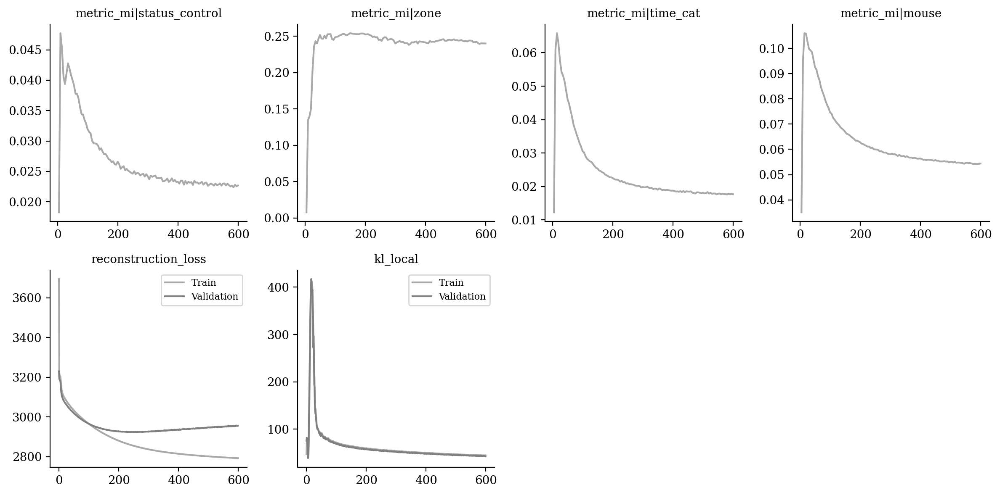

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

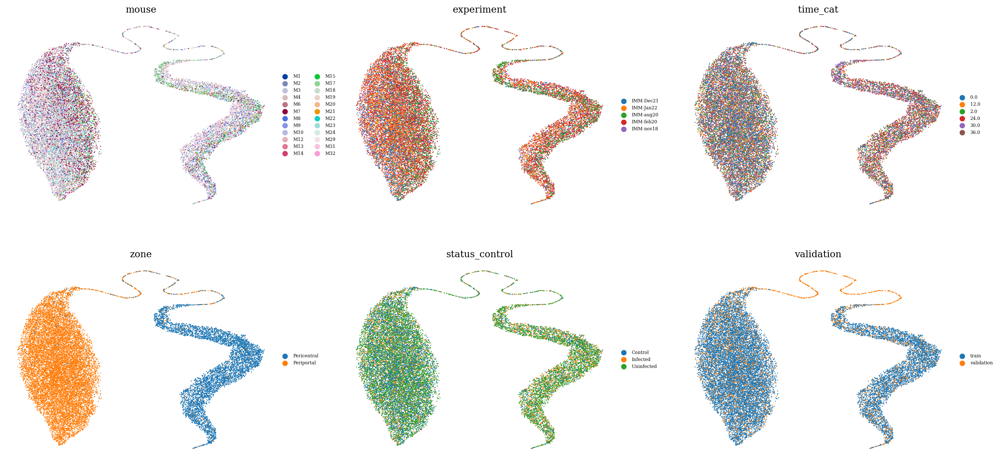

In [13]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

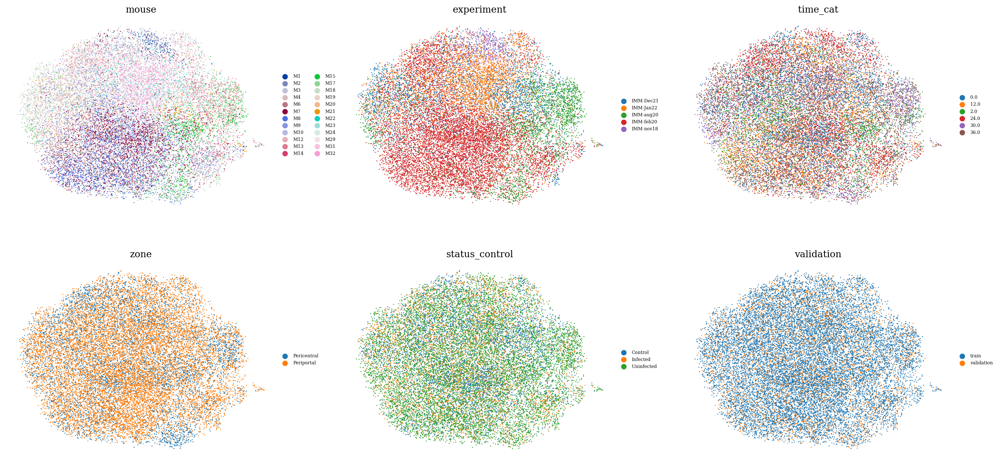

In [14]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [15]:
from tardis._utils.functions import label_transfer

In [16]:
k = "zone"
sublatent = DM.configurations.get_by_obs_key(k).reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())

reference_embeddings = latent[vae.train_indices, :].copy()
query_embeddings = latent[vae.validation_indices, :].copy()

sc.pp.neighbors(reference_embeddings, n_neighbors=30)
label_transfer(reference_embeddings, query_embeddings, cluster_list=[k], neighbors_count=30)

predicted = query_embeddings.obs[f"transf_{k}"].astype(str).values
true = query_embeddings.obs[k].astype(str).values

import sklearn
metrics = {}
metrics['accuracy'] = sklearn.metrics.accuracy_score(true, predicted)
metrics['precision_macro'] = sklearn.metrics.precision_score(true, predicted, average='macro', zero_division=0)
metrics['recall_macro'] = sklearn.metrics.recall_score(true, predicted, average='macro', zero_division=0)
metrics['f1_score_macro'] = sklearn.metrics.f1_score(true, predicted, average='macro', zero_division=0)
metrics['precision_micro'] = sklearn.metrics.precision_score(true, predicted, average='micro', zero_division=0)
metrics['recall_micro'] = sklearn.metrics.recall_score(true, predicted, average='micro', zero_division=0)
metrics['f1_score_micro'] = sklearn.metrics.f1_score(true, predicted, average='micro', zero_division=0)
metrics['precision_weighted'] = sklearn.metrics.precision_score(true, predicted, average='weighted', zero_division=0)
metrics['recall_weighted'] = sklearn.metrics.recall_score(true, predicted, average='weighted', zero_division=0)
metrics['f1_score_weighted'] = sklearn.metrics.f1_score(true, predicted, average='weighted', zero_division=0)
metrics['confusion_matrix'] = sklearn.metrics.confusion_matrix(true, predicted)
metrics

{'accuracy': 0.8905511811023622,
 'precision_macro': 0.8645156803302984,
 'recall_macro': 0.8744416872620734,
 'f1_score_macro': 0.869210976113018,
 'precision_micro': 0.8905511811023622,
 'recall_micro': 0.8905511811023622,
 'f1_score_micro': 0.8905511811023622,
 'precision_weighted': 0.8924083567967356,
 'recall_weighted': 0.8905511811023622,
 'f1_score_weighted': 0.8912860939447503,
 'confusion_matrix': array([[ 927,  182],
        [ 235, 2466]])}

In [17]:
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy='most_frequent')
dummy_clf.fit(true.reshape(-1, 1), true)
dummy_predictions = dummy_clf.predict(true.reshape(-1, 1))
accuracy = sklearn.metrics.accuracy_score(true, dummy_predictions)
print(f"Baseline Accuracy: {accuracy}")

Baseline Accuracy: 0.7089238845144357


In [18]:
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy='stratified')
dummy_clf.fit(true.reshape(-1, 1), true)
dummy_predictions = dummy_clf.predict(true.reshape(-1, 1))
accuracy = sklearn.metrics.accuracy_score(true, dummy_predictions)
print(f"Baseline Accuracy: {accuracy}")

Baseline Accuracy: 0.583989501312336


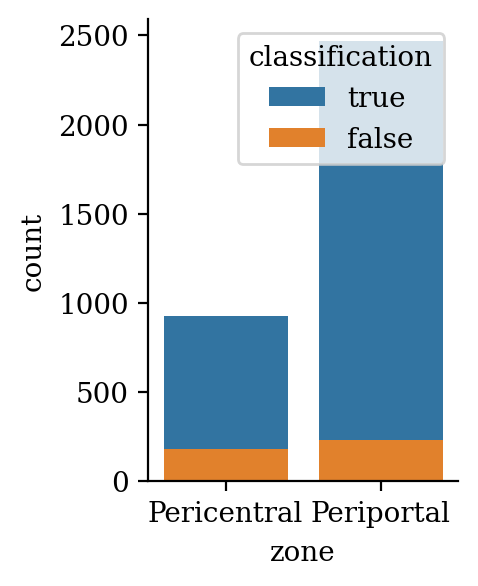

In [19]:
query_embeddings.obs["classification"] = 'false'
query_embeddings.obs.loc[query_embeddings.obs[k] == query_embeddings.obs[f"transf_{k}"], "classification"] = 'true'
grouped = query_embeddings.obs.groupby('zone')['classification'].value_counts().rename('count').reset_index()

# Plotting the data
plt.figure(figsize=(2, 3))
# Create a barplot, which inherently supports stacking by using the 'hue' argument, and normalize the height by 'proportion'
sns.barplot(data=grouped, x='zone', y='count', hue='classification', dodge=False)
sns.despine()
plt.show()